In [1]:
__author__ = 'Shi Fan'
import glob
import pandas as pd, numpy as np
import pylab as pl
import os
%pylab inline
from scipy import signal
import pickle as pkl

Populating the interactive namespace from numpy and matplotlib


In [2]:
shutter = [120, 119.75, 119, 100, 50, 10]
noshutter_pulse = [120, 119.75, 0]

# setting values early on
nrow = 1080
ncol = 1920
nband = 3

REREAD=False
#REREAD=True
#FBB adding env variable so it is easy to run on different machines
datapath=os.getenv('UIdata')
print (datapath)
if not datapath:
    datapath = '/scratch/share/fbianco'
    print (datapath)

if REREAD:
    
    shutter_photos4 = {}
    shutter_photos35 = {}
    noshutter_photos4 = {}
    noshutter_photos35 = {}

    for i in shutter:
        if i == 119.75:
            shutter_path4 = datapath+'/LEDtest2/s%s_c4*.raw' % 11975
            shutter_path35 = datapath+'/LEDtest2/s%s_c35*.raw' % 11975
        else:
            shutter_path4 = datapath+'/LEDtest2/s%s_c4*.raw' % i
            shutter_path35 = datapath+'/LEDtest2/s%s_c35*.raw' % i
        print (shutter_path4)
        shutter_photos4[i] = glob.glob(shutter_path4)
        shutter_photos35[i] = glob.glob(shutter_path35)
        print (shutter_photos4[i])
    # the files should have been saved with better names
    for i in noshutter_pulse:
        if i == 0:
            noshutter_path4 = datapath+'/LEDtest2/noshutter_nopulse_c4*.raw'
            noshutter_path35 = datapath+'/LEDtest2/noshutter_nopulse_c35*.raw'
        elif i == 119.75:
            noshutter_path4 = datapath+'/LEDtest2/noshutter_pulse%s_c4*.raw' % 11975
            noshutter_path35 = datapath+'/LEDtest2/noshutter_pulse%s_c35*.raw' % 11975
        else:
            noshutter_path4 = datapath+'/LEDtest2/noshutter_pulse%s_c4*.raw' % i
            noshutter_path35 = datapath+'/LEDtest2/noshutter_pulse%s_c35*.raw' % i
        noshutter_photos4[i] = glob.glob(noshutter_path4)
        noshutter_photos35[i] = glob.glob(noshutter_path35)
        
    #Converting series into Numpy arrays
    shutter_photo_arr4 = {}
    shutter_photo_arr35 = {}
    noshutter_photo_arr4 = {}
    noshutter_photo_arr35 = {}

    for key, value in shutter_photos4.iteritems():
        shutter_photo_arr4[key] = np.array(value)[np.argsort(value)] 
        #print (shutter_photo_arr4[key])
    for key, value in shutter_photos35.iteritems():
        shutter_photo_arr35[key] = np.array(value)[np.argsort(value)]
        
    for key, value in noshutter_photos4.iteritems():
        noshutter_photo_arr4[key] = np.array(value)[np.argsort(value)]
        
    for key, value in noshutter_photos35.iteritems():
        noshutter_photo_arr35[key] = np.array(value)[np.argsort(value)]
        
    pl.figure()
    pl.title('w/ shuter')
    pl.imshow(np.fromfile(shutter_photo_arr4[50][10], dtype=np.uint8).reshape(nrow, ncol, nband)[640:750,955:1105])

    pl.figure()
    pl.title('w/out shutter')
    pl.imshow(np.fromfile(noshutter_photo_arr4[120][10], dtype=np.uint8).reshape(nrow, ncol, nband)[590:700,895:1042])
    pl.show()

None
/scratch/share/fbianco


In [3]:
if REREAD:
    shutter_photo_resized4 = {}
    shutter_photo_resized35 = {}
    noshutter_photo_resized4 = {}
    noshutter_photo_resized35 = {}

    # initialization
    for key, value in shutter_photo_arr4.iteritems():
        shutter_photo_resized4[key] = np.zeros(len(value))
    for key, value in shutter_photo_arr35.iteritems():
        shutter_photo_resized35[key] = np.zeros(len(value))
    for key, value in noshutter_photo_arr4.iteritems():
        noshutter_photo_resized4[key] = np.zeros(len(value))
    for key, value in noshutter_photo_arr35.iteritems():
        noshutter_photo_resized35[key] = np.zeros(len(value))

    # shutter
    for r in shutter_photo_resized4:
        for i,f in enumerate(shutter_photo_arr4[r]):
            shutter_photo_resized4[r][i] = sum(np.fromfile(f,dtype=np.uint8).reshape(nrow,ncol,nband)[640:750,955:1105]) 
    pkl.dump(shutter_photo_resized4, open(datapath+'/ht_pickles/LEDtest2_lcv_4hz.pkl', 'wb'))
    
    for r in shutter_photo_resized35:
        for i,f in enumerate(shutter_photo_arr35[r]):
            shutter_photo_resized35[r][i] = sum(np.fromfile(f,dtype=np.uint8).reshape(nrow,ncol,nband)[640:750,955:1105]) 
    pkl.dump(shutter_photo_resized35, open(datapath+'/ht_pickles/LEDtest2_lcv_35hz.pkl', 'wb'))
    
    # no shutter
    for r in noshutter_photo_resized4:
        for i,f in enumerate(noshutter_photo_arr4[r]):
            noshutter_photo_resized4[r][i] = sum(np.fromfile(f,dtype=np.uint8).reshape(nrow,ncol,nband)[590:700,895:1042])
    pkl.dump(noshutter_photo_resized4, open(datapath+'/ht_pickles/LEDtest2_no_4hz.pkl', 'wb'))
    
    for r in noshutter_photo_resized35:
        for i,f in enumerate(noshutter_photo_arr35[r]):
            noshutter_photo_resized35[r][i] = sum(np.fromfile(f,dtype=np.uint8).reshape(nrow,ncol,nband)[590:700,895:1042])
    pkl.dump(noshutter_photo_resized35, open(datapath+'/ht_pickles/LEDtest2_no_35hz.pkl', 'wb'))
            
else:
    #FBB this is when we do not want to reread the images but just use the time series
    pklfiles = glob.glob(datapath+'/ht_pickles/LEDtest2*.pkl')
    shutter_photo_resized4 = pkl.load(open(datapath+'/ht_pickles/LEDtest2_lcv_4hz.pkl', 'rb'))
    shutter_photo_resized35 = pkl.load(open(datapath+'/ht_pickles/LEDtest2_lcv_35hz.pkl', 'rb'))
    noshutter_photo_resized4 = pkl.load(open(datapath+'/ht_pickles/LEDtest2_no_4hz.pkl', 'rb'))
    noshutter_photo_resized35 = pkl.load(open(datapath+'/ht_pickles/LEDtest2_no_35hz.pkl', 'rb'))

In [4]:
#function definitions
#we like them altogether so we can easily find a function definition when we need to

def mynorm(flux):
    flux -= flux.mean()
    return 2*(flux-flux.min())/(flux.max()-flux.min())

def plot_flux_by_img_num(flux, c_freq, shutter):
    for key, value in flux.iteritems():
        pl.figure(figsize=(20,5))
        if shutter:
            pl.title('Shutter Flux: '+str(key)+'Hz; Camera: '+str(c_freq)+'Hz', fontsize=20)
            color = 'dodgerblue'
        else:
            pl.title('No Shutter Flux: Pulse '+str(key)+'Hz; Camera: '+str(c_freq)+'Hz', fontsize=20)
            color = 'steelblue'
        pl.plot(value, '-', color=color, linewidth=0.75)
        pl.plot(value, 'o', color=color)
        pl.xlabel("Image number", fontsize=15)
        pl.ylabel("Almost normalized flux", fontsize=15)
        pl.ylim(-.1,2.1)
        pl.show()
        
def plot_flux_by_runtime(flux, c_freq, runtime, shutter):
    for key, value in flux.iteritems():
        pl.figure(figsize=(20,5))
        if shutter:
            color = 'violet'
            pl.title('Shutter Flux: '+str(key)+'Hz; Camera: '+str(c_freq)+'Hz', fontsize=20)
        else:
            color = 'mediumorchid'
            pl.title('No Shutter Flux: Pulse '+str(key)+'Hz; Camera: '+str(c_freq)+'Hz', fontsize=20)
        try:
            pl.plot(runtime[c_freq], flux[key], '-', color=color, linewidth=0.75)
            pl.plot(runtime[c_freq], flux[key], 'o', color=color)
        except:
            print ('Camera frequency has to be 4 or 3.5')
            break
        if c_freq==4.0:
            pl.xlim(0,125)
        elif c_freq==3.5:
            pl.xlim(0,143)
        pl.xlabel("Seconds", fontsize=15)
        pl.ylabel("Almost normalized flux", fontsize=15)
        pl.ylim(-.1,2.1)
        pl.show() 
        
        
def sim_wave(w_type, time, freq, mag=1, phase=0):
    #print time.shape
    if w_type=='sine':
        wave = mag*np.sin(2*np.pi*freq*time+phase)+mag
    elif w_type=='square':
        wave = mag*signal.square(2*np.pi*freq*time+phase)+mag
    else:
        print ('Please enter sine or square for simulated wave type')
    return wave


#Plotting the simulated fluxes for camera speed of 4hz
#This flux equals the points in which the camera "meets" the shutter wave
#Stacking the flux over each 10 datapoints and normalizing by 10

def camera_meets_shutter_wave(w_type, time, cam, c_freq):
    inter = {}
    
    if time.shape!=cam.shape:
        print ('Time series must have the same length as camera wave')
    
    if (w_type!='sine') & (w_type!='square'):
        print ('Please enter sine or square for simulated wave type')

    for i in shutter:
        pl.figure(figsize(20, 5))
        if w_type=='sine':
            color = 'forestgreen'
            inter[i] = sim_wave(w_type, time, float(i))*cam
        elif w_type=='square':
            color = 'mediumspringgreen'
            temp = sim_wave(w_type, time, float(i))*cam
            print (temp.shape)
            intinter = np.zeros(len(cam)/10)
            for j in range(10): intinter += temp[j::10]
            inter[i] = intinter/10
            time = time[::10]
        pl.plot(time, inter[i], '-', color=color, linewidth=0.75)
        pl.plot(time, inter[i], 'o', color=color, linewidth=0.75)
        pl.title('Simulated flux ('+w_type+'): Shutter '+str(i)+'Hz; Camera: '+str(c_freq)+'Hz', fontsize=20)
        pl.xlabel('Seconds')
        pl.ylabel('Simulated flux')
        
        if c_freq==4:
            pl.xlim(0,125)
        elif c_freq==3.5:
            pl.xlim(0,143)
            
        pl.ylim(-.1,2.1)
        pl.show()
    return inter
        
def folding(flux, runtime, freq):
    runtime_mod = np.mod( runtime, 2.0/freq)
    return flux, runtime_mod # return time in microseconds


## Flux vs Image Number

### With Shutter

In [5]:
#Creating dictionaries for flux
#Normalizing flux by (flux-mean)/std

shutter_flux4 = {}
shutter_flux35 = {}
noshutter_flux4 = {}
noshutter_flux35 = {}

for key, value in shutter_photo_resized4.iteritems():
    shutter_flux4[key] = mynorm(value)

for key, value in shutter_photo_resized35.iteritems():
    shutter_flux35[key] = mynorm(value)
    
for key, value in noshutter_photo_resized4.iteritems():
    noshutter_flux4[key] = mynorm(value)
    
for key, value in noshutter_photo_resized35.iteritems():
    noshutter_flux35[key] = mynorm(value)

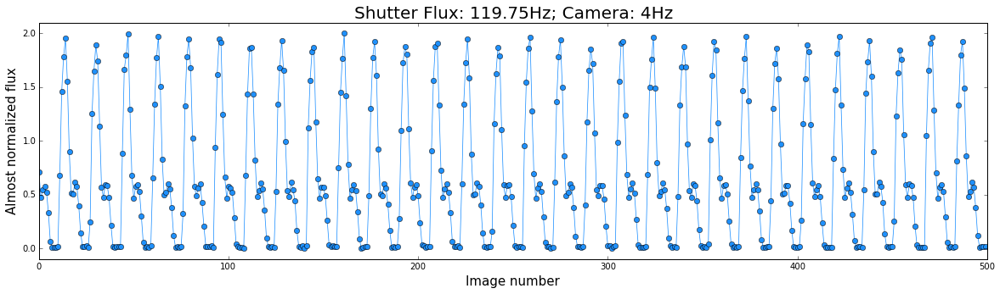

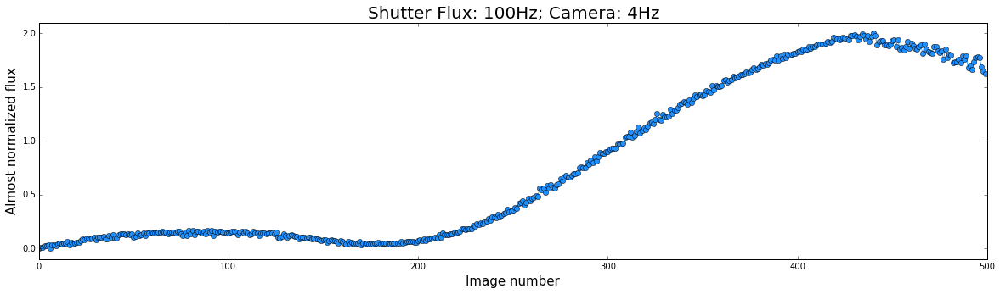

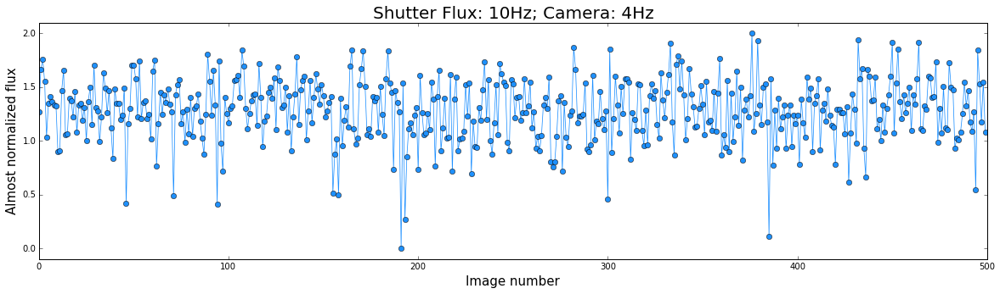

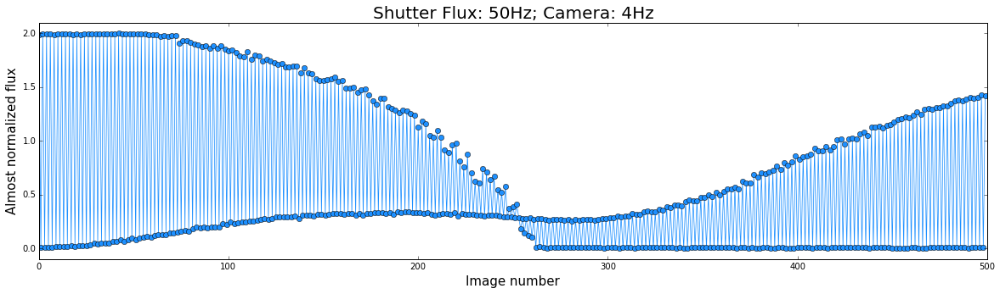

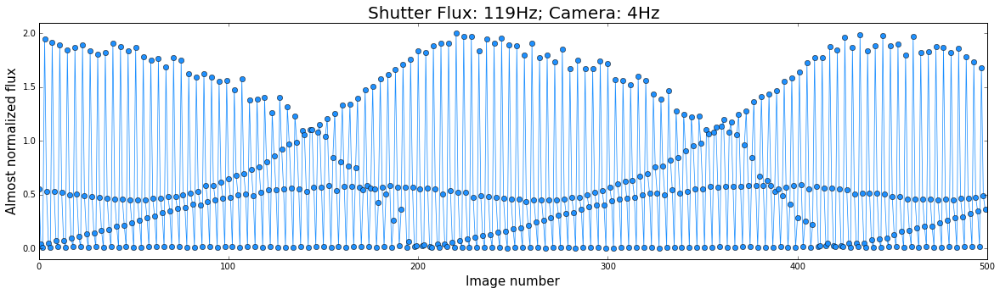

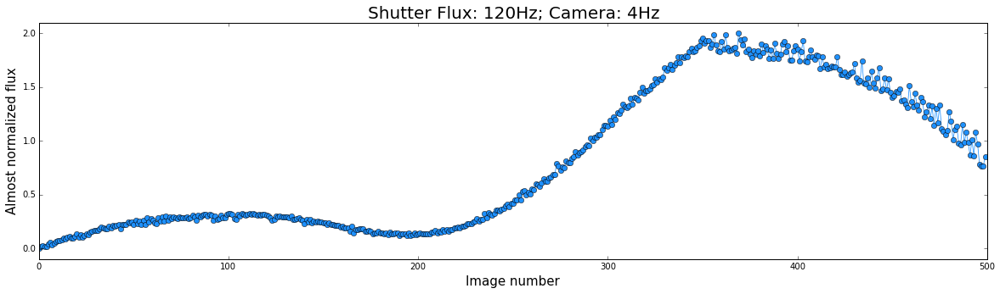

In [6]:
plot_flux_by_img_num(shutter_flux4, 4, True)

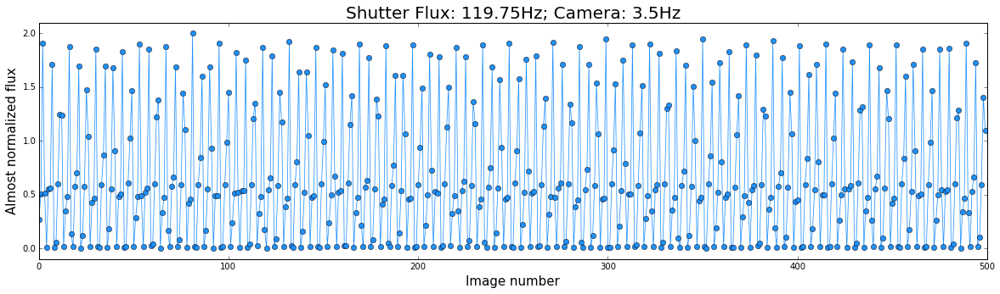

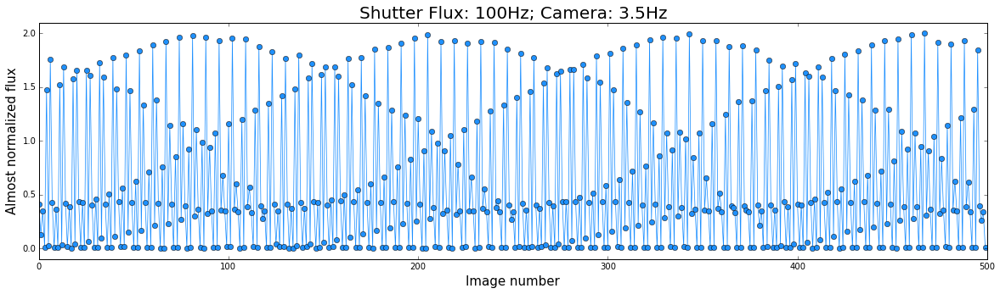

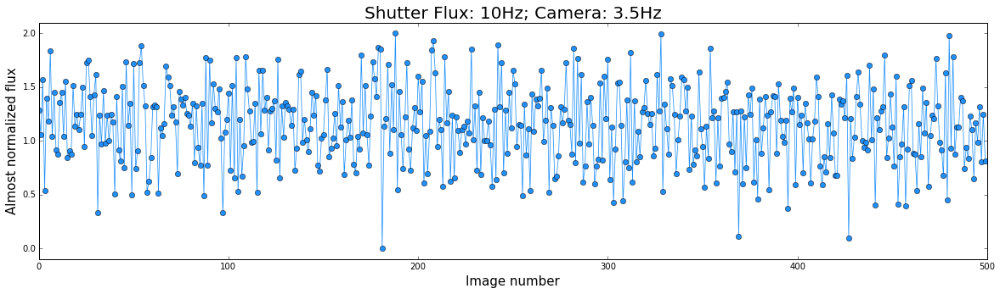

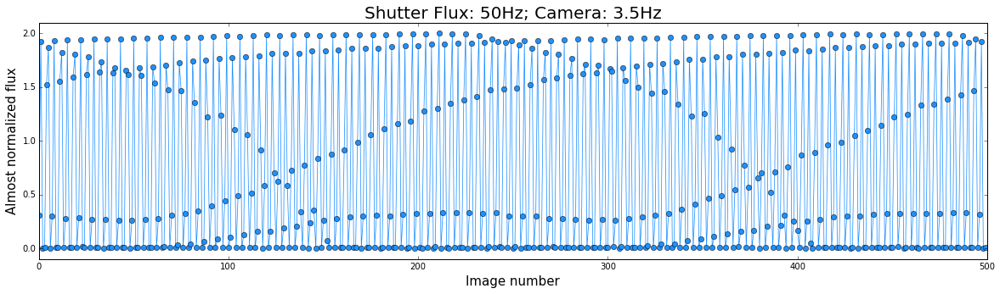

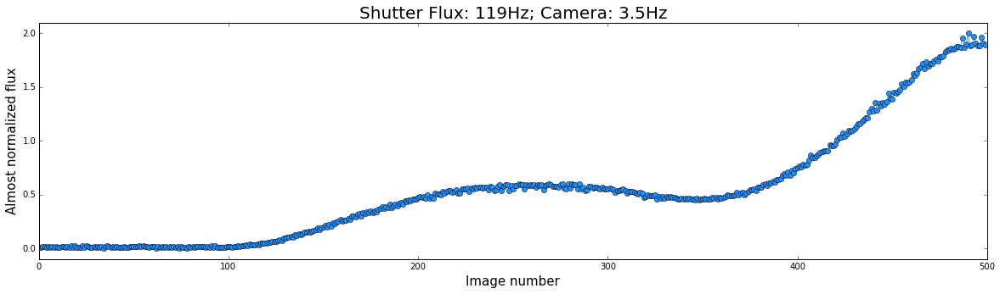

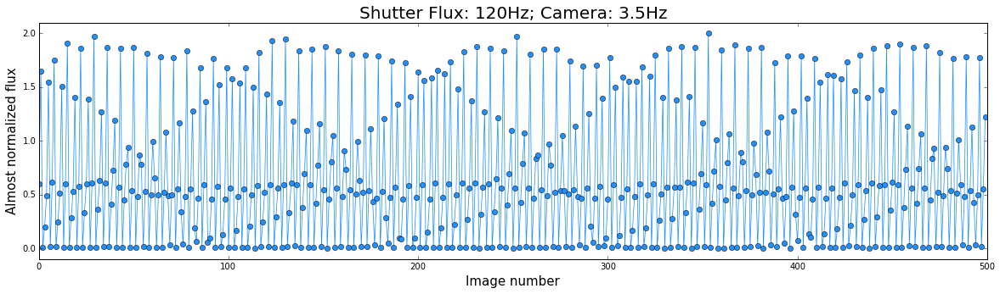

In [7]:
plot_flux_by_img_num(shutter_flux35, 3.5, True)

### Without Shutter (Pulse)

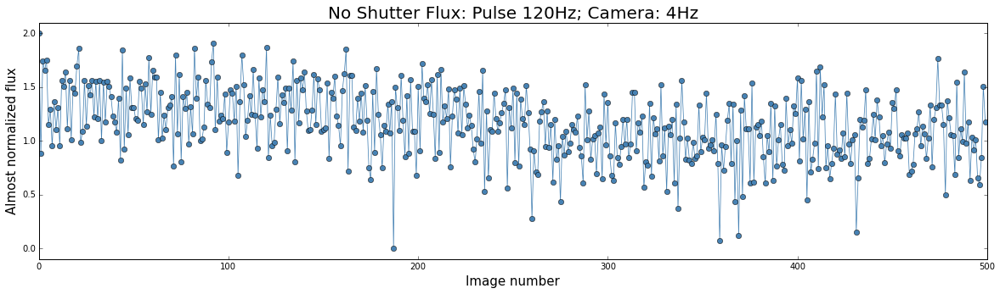

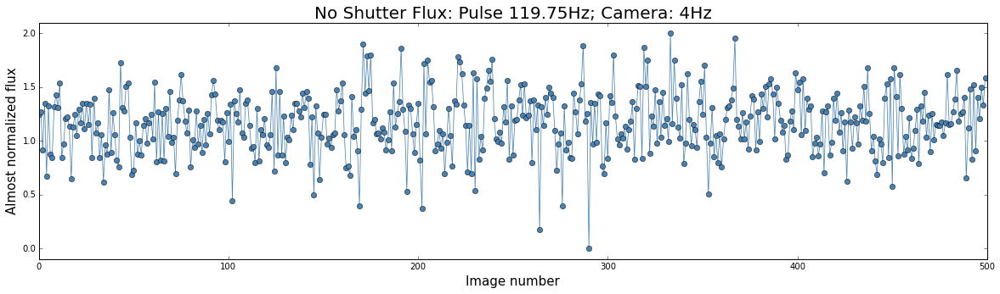

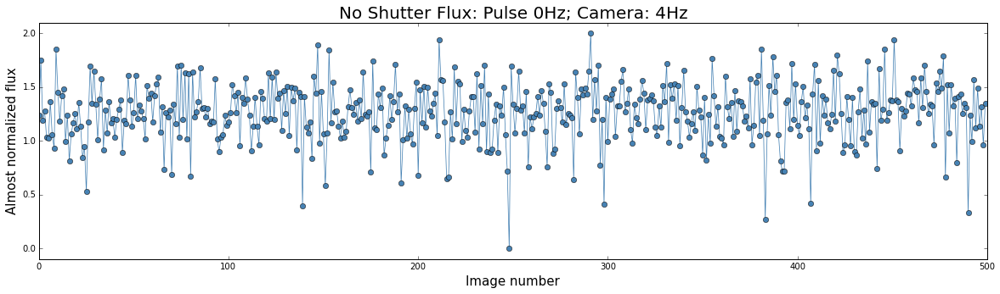

In [8]:
plot_flux_by_img_num(noshutter_flux4, 4, False)

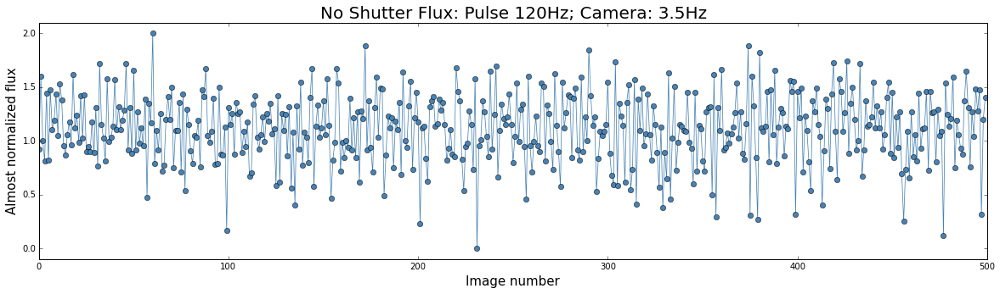

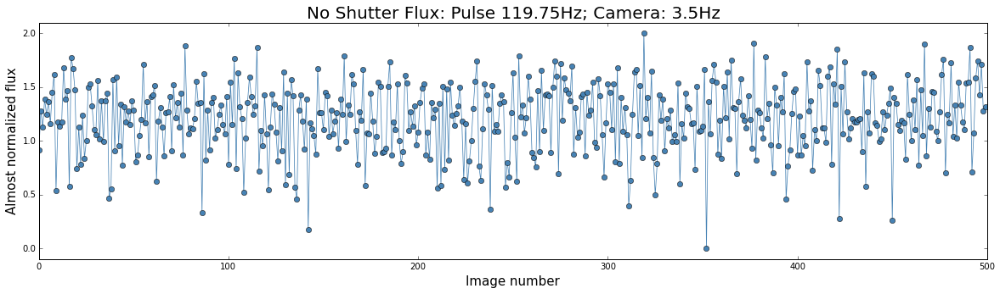

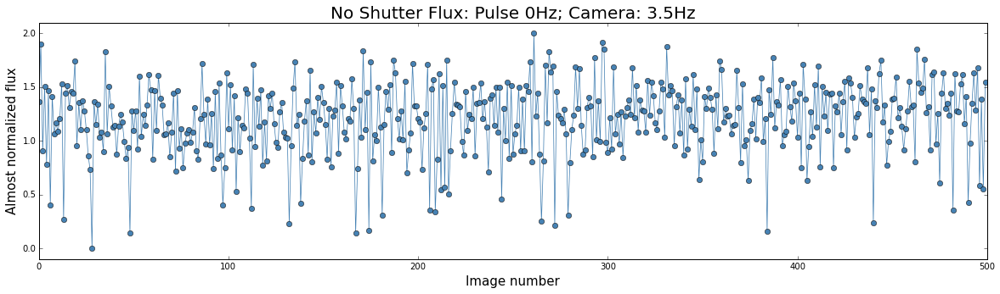

In [9]:
plot_flux_by_img_num(noshutter_flux35, 3.5, False)

## Flux vs Time

In [10]:
#Calculating the runtime

runtime4 = np.linspace(0, len(shutter_photo_resized4[10])/4.0, len(shutter_photo_resized4[10]), endpoint=True)
runtime35 = np.linspace(0, len(shutter_photo_resized35[10])/3.5, len(shutter_photo_resized35[10]), endpoint=True)

### With Shutter

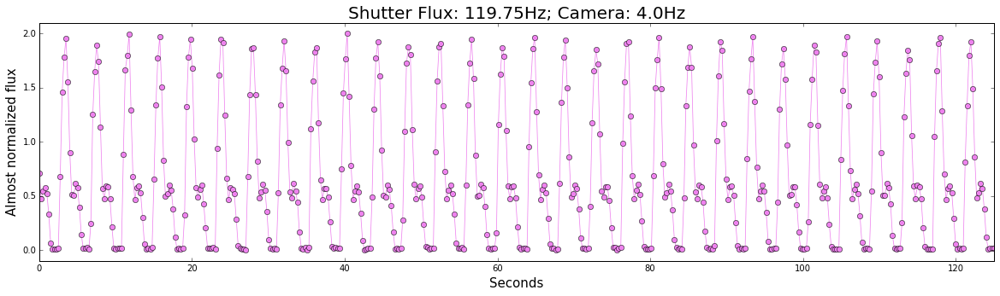

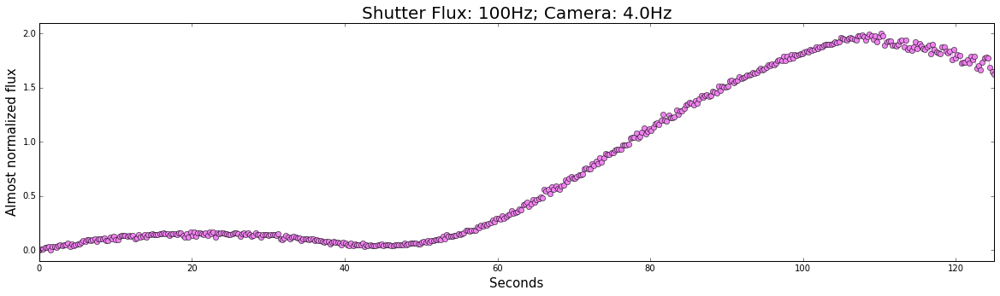

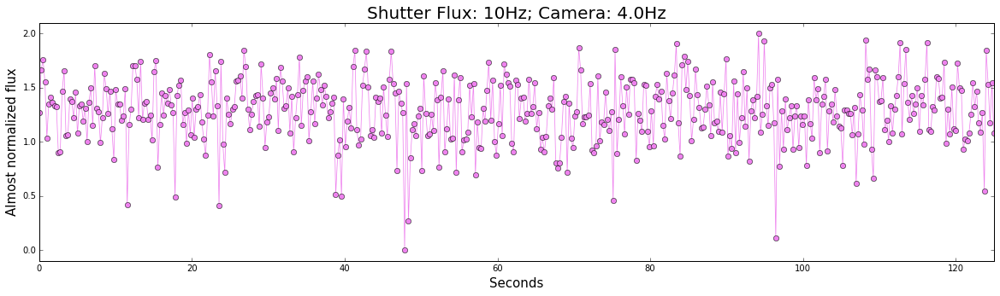

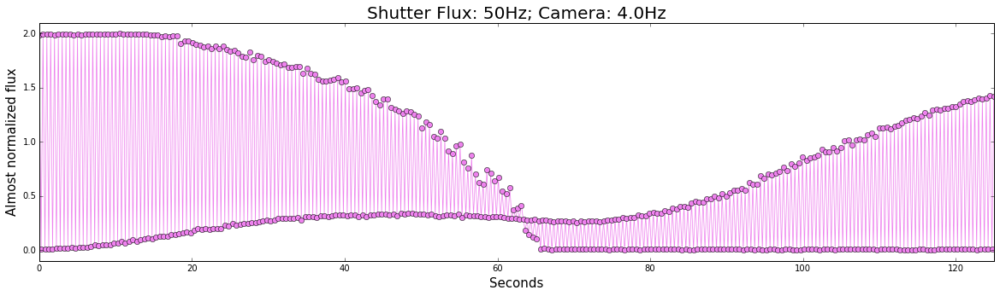

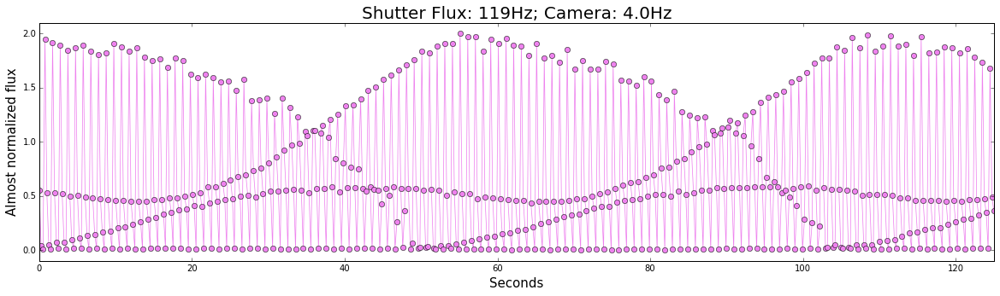

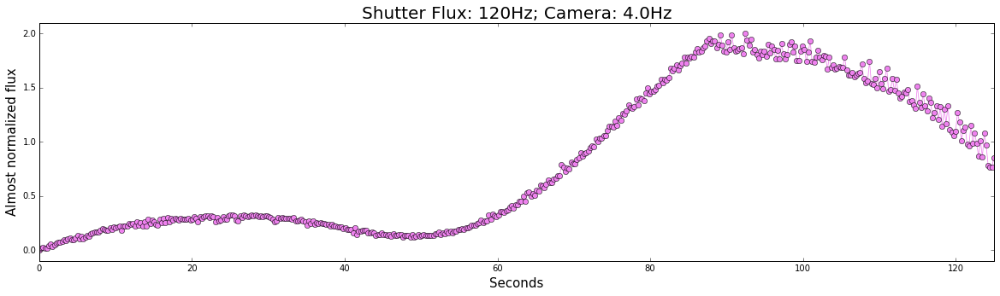

In [11]:
plot_flux_by_runtime(shutter_flux4, 4.0, {4.0:runtime4, 3.5:runtime35}, True)

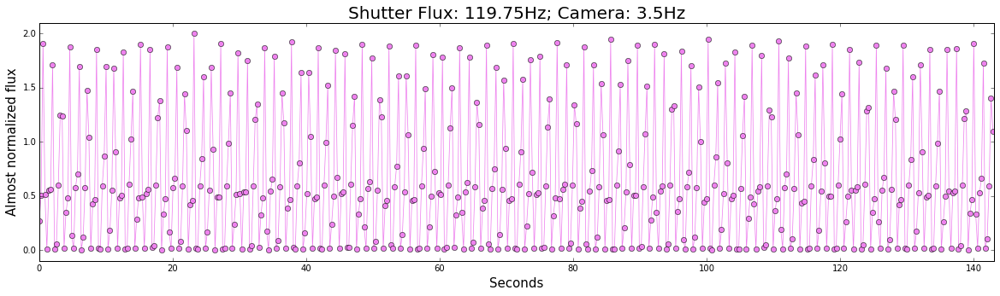

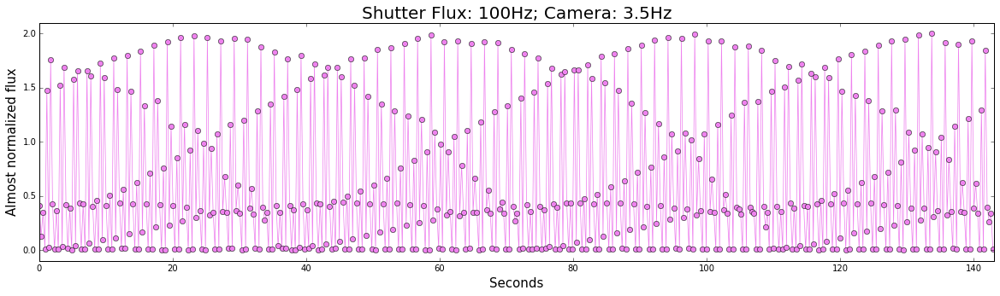

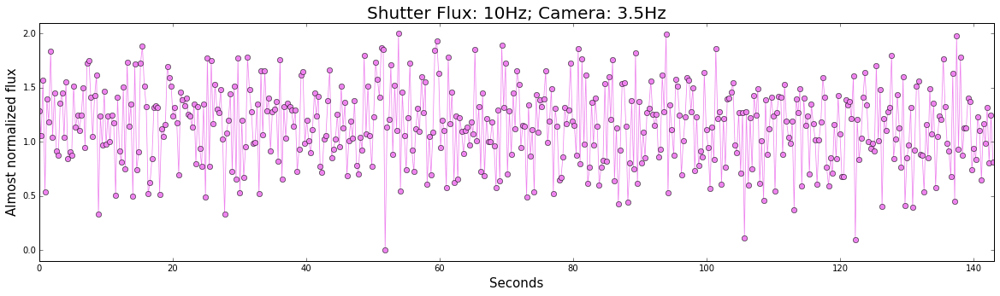

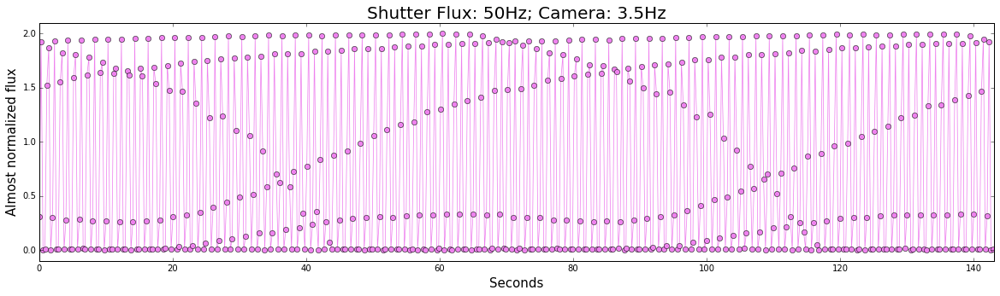

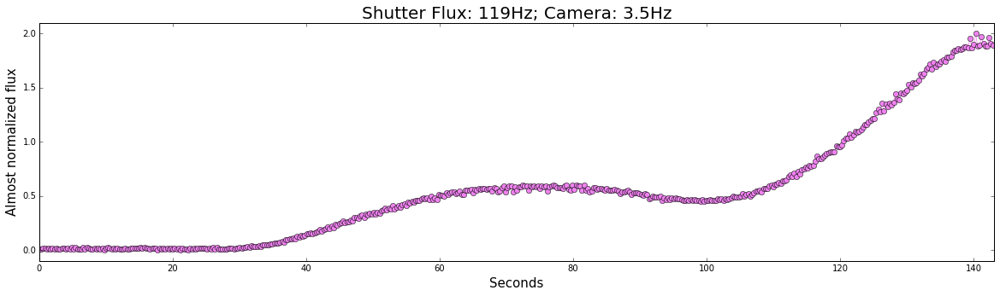

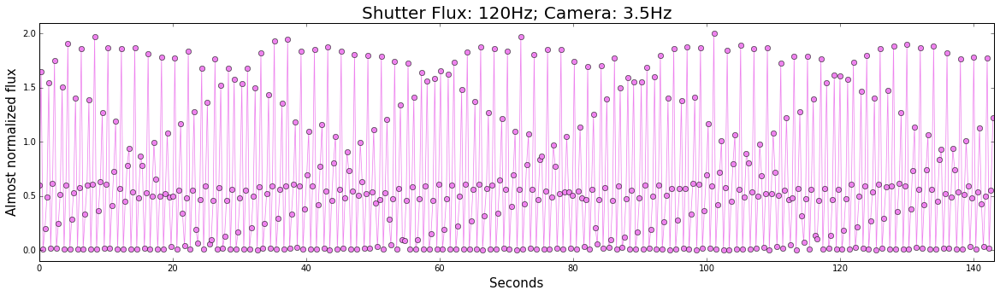

In [12]:
plot_flux_by_runtime(shutter_flux35, 3.5, {4.0:runtime4, 3.5:runtime35}, True)

### Without Shutter (Pulse)

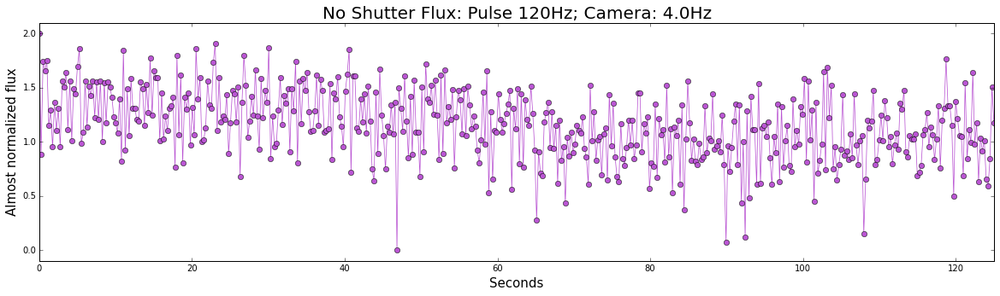

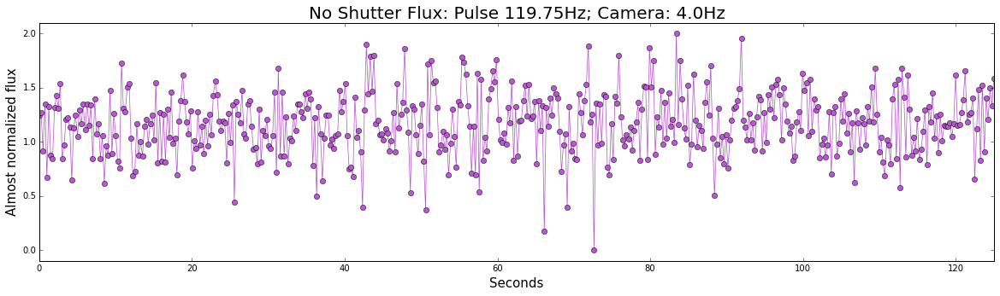

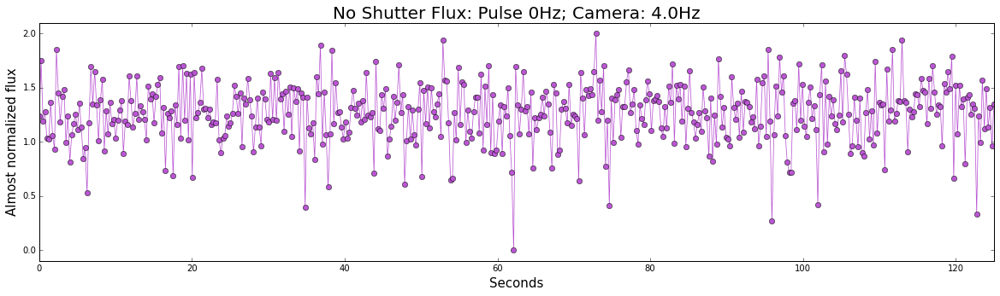

In [13]:
plot_flux_by_runtime(noshutter_flux4, 4.0, {4.0:runtime4, 3.5:runtime35}, False)

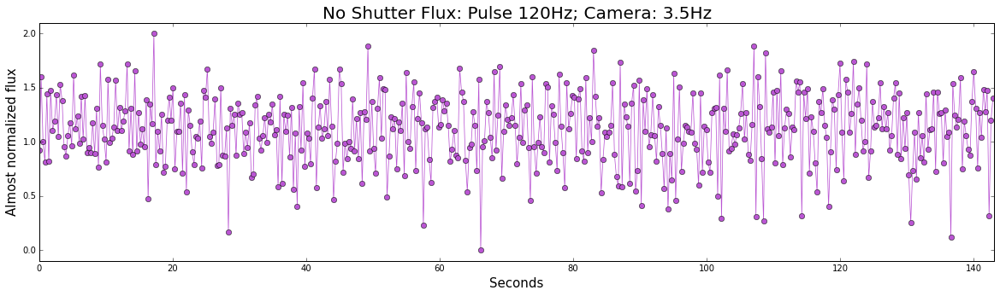

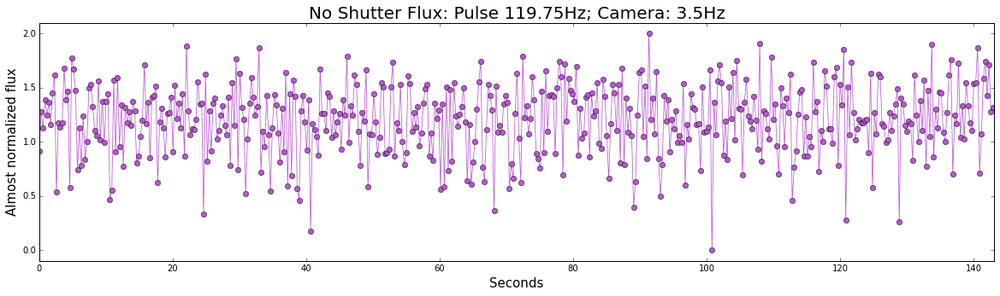

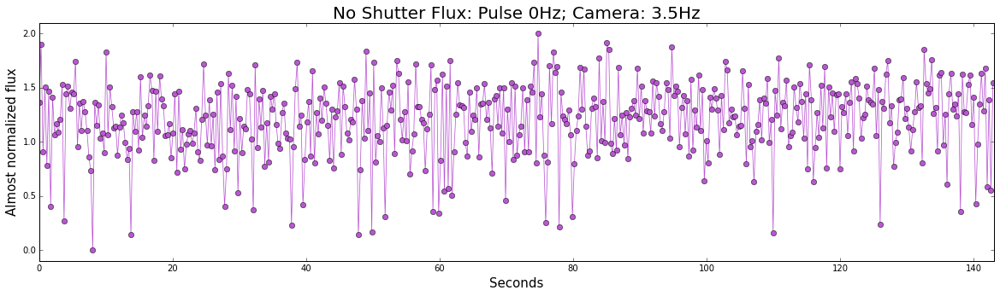

In [14]:
plot_flux_by_runtime(noshutter_flux35, 3.5, {4.0:runtime4, 3.5:runtime35}, False)

## Folded Flux (2 Shutter Cycles)

### Simulated Flux

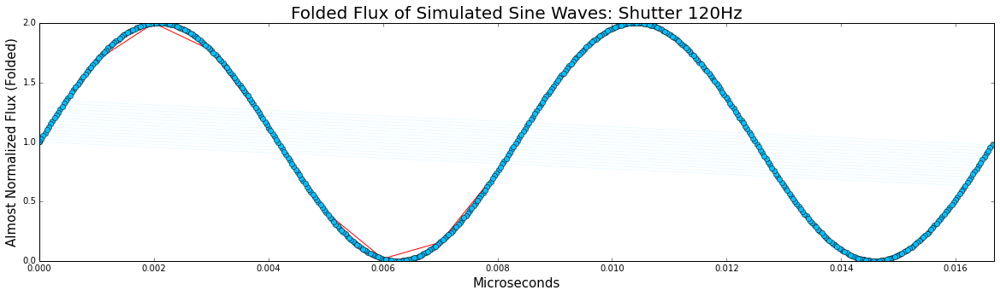

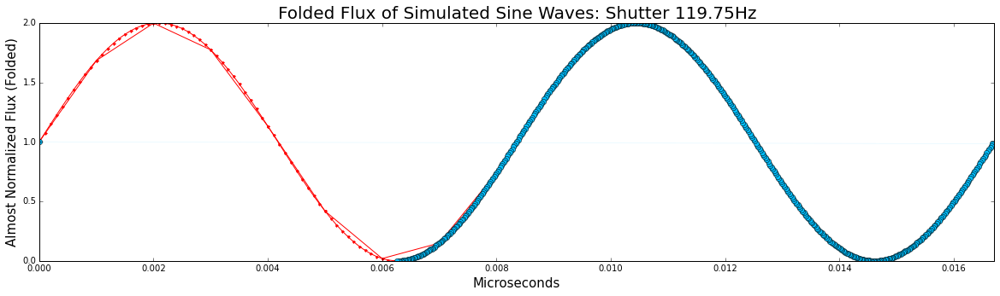

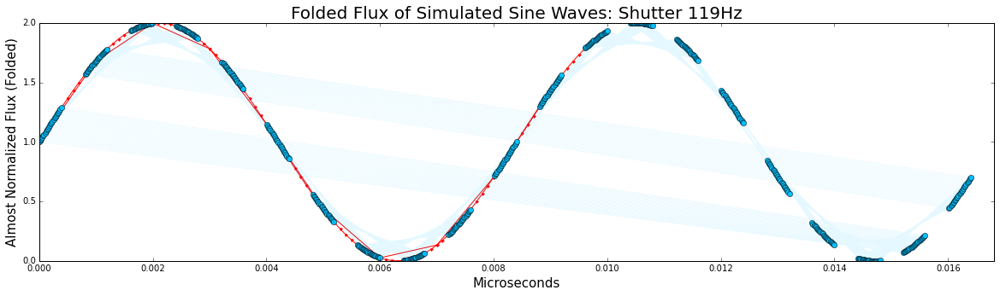

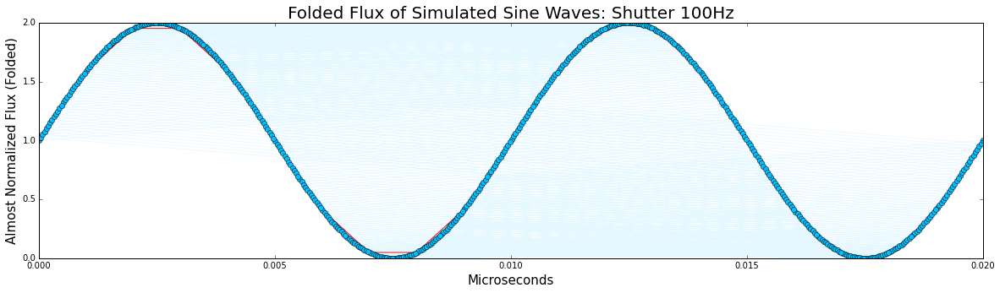

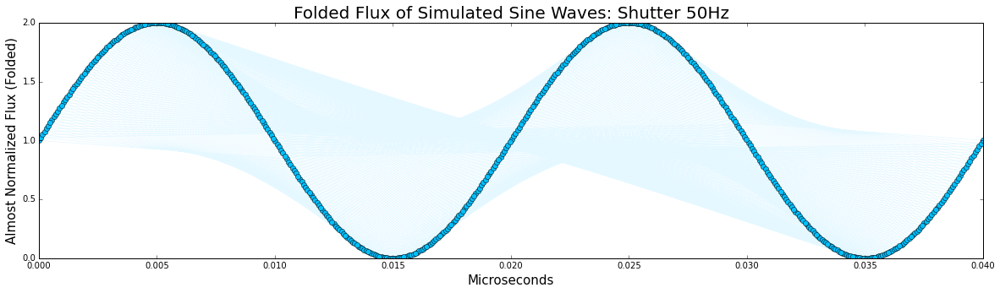

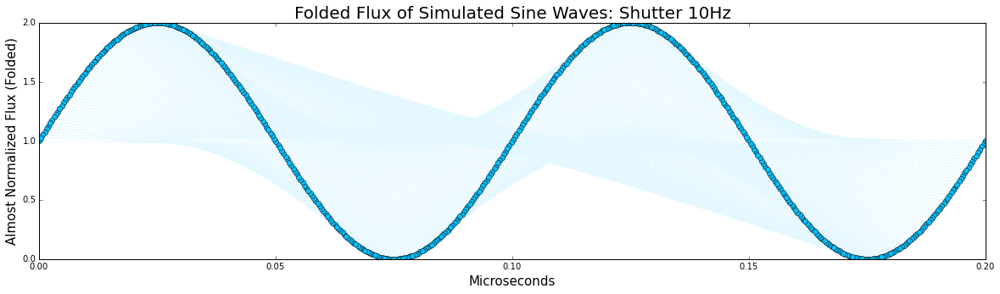

In [15]:
time = np.linspace(0, 150, 150*1000, endpoint=False)
time2 = np.linspace(0, 150, 150*10000, endpoint=False)

# Testing the folding algorithm on simulated sine waves
# 4Hz
# The original runtime is by seconds, so we need to multiply by 1000 before modding by 2 shuttercycles
for freq in shutter:
    sim_flux, sim_time = folding(sim_wave('sine', runtime4, float(freq)), runtime4, float(freq))
    pl.figure(figsize=(20,5))
    pl.plot(time[:100]*0.1,sim_wave('sine', time[:100]*0.1, float(freq)),'r.-')
    pl.plot(time[:10],sim_wave('sine', time[:10], float(freq)),'r.-')
    pl.plot(sim_time, sim_flux, '-', color='deepskyblue', linewidth=0.75, alpha=0.1)
    pl.plot(sim_time, sim_flux, 'o', color='deepskyblue')
    pl.xlabel("Microseconds", fontsize=15)
    pl.ylabel("Almost Normalized Flux (Folded)", fontsize=15)
    pl.title('Folded Flux of Simulated Sine Waves: Shutter '+str(freq)+'Hz', fontsize=20)
    pl.xlim(0,2./freq)
    pl.show()

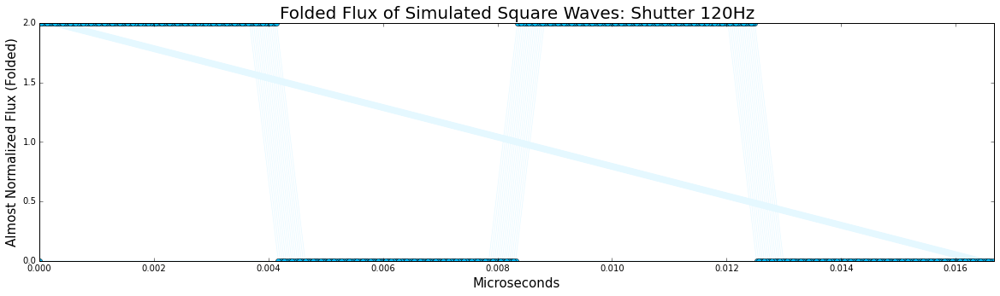

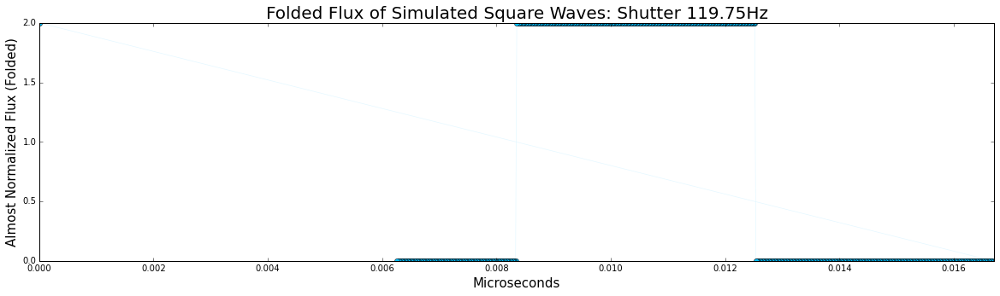

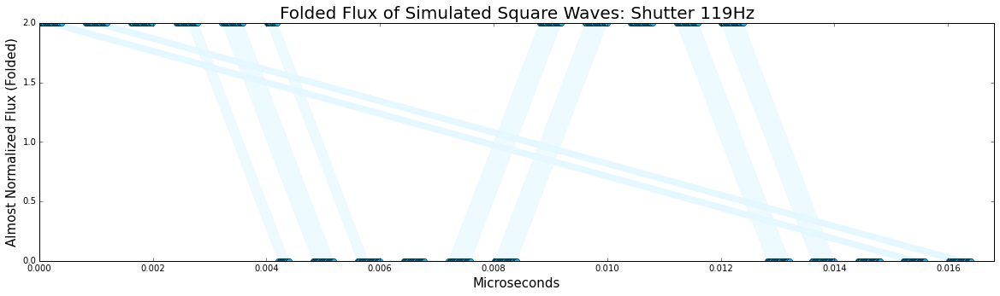

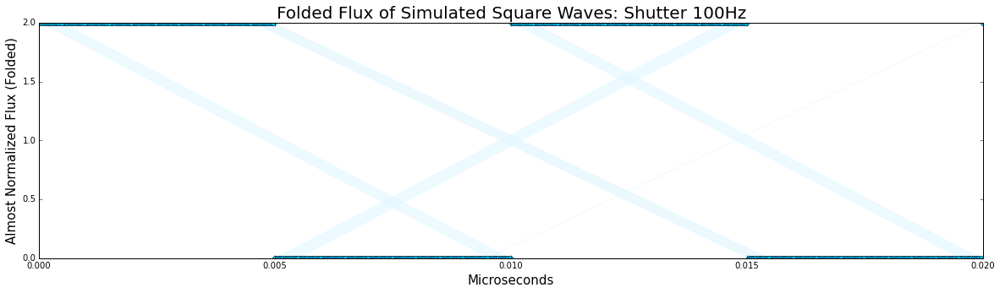

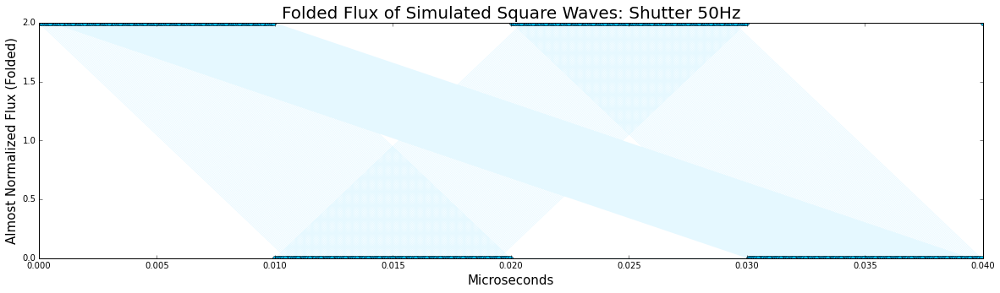

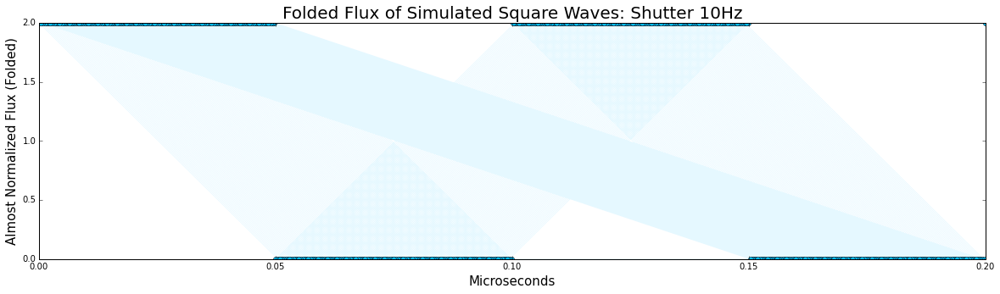

In [16]:
for i in shutter:
    sim_flux, sim_time = folding(sim_wave('square', runtime4, i), runtime4, float(i))
    pl.figure(figsize=(20,5))
    pl.plot(sim_time, sim_flux, '-', color='deepskyblue', linewidth=0.75, alpha=0.1)
    pl.plot(sim_time, sim_flux, 'o', color='deepskyblue')
    pl.xlabel("Microseconds", fontsize=15)
    pl.ylabel("Almost Normalized Flux (Folded)", fontsize=15)
    pl.title('Folded Flux of Simulated Square Waves: Shutter '+str(i)+'Hz', fontsize=20)
    pl.xlim(0,2./i)
    pl.show()

### Actual Flux

#### With Shutter (folded by shutter frequency)

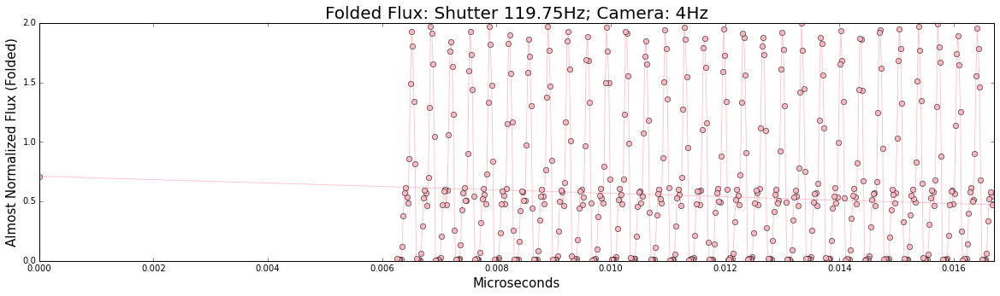

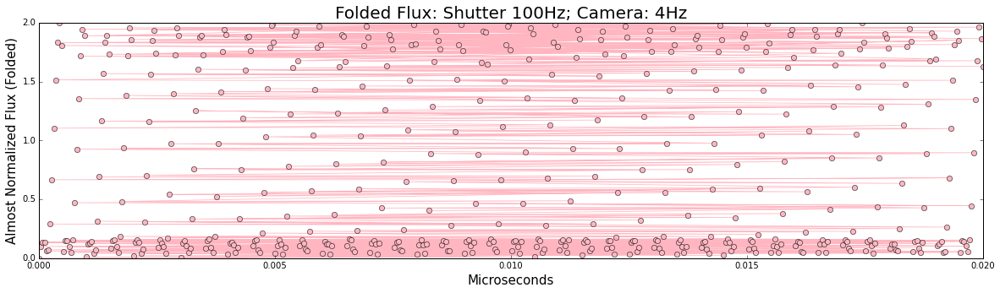

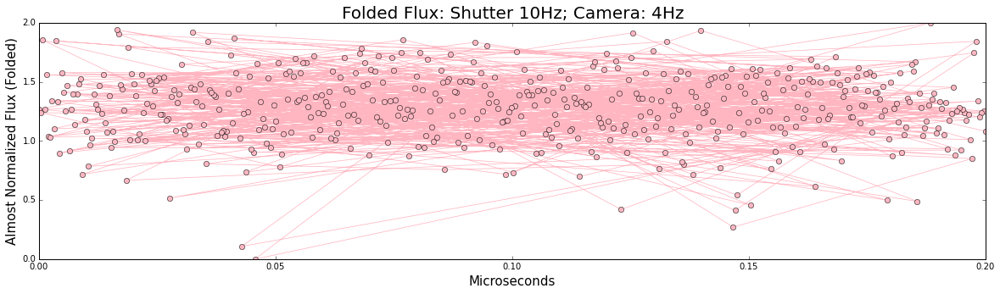

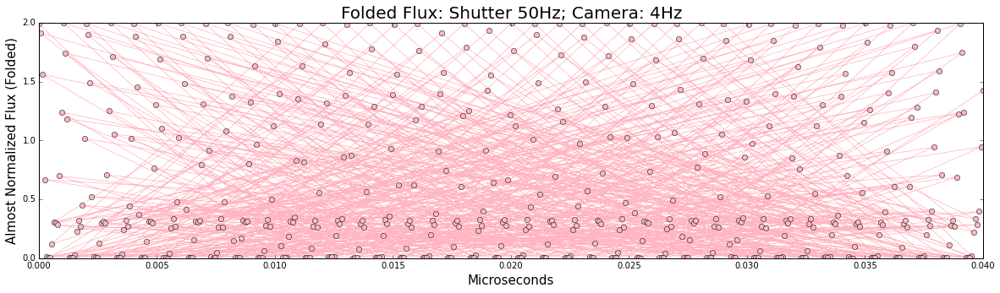

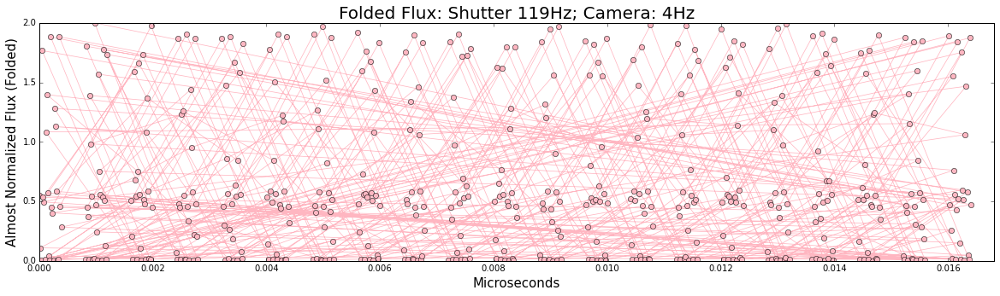

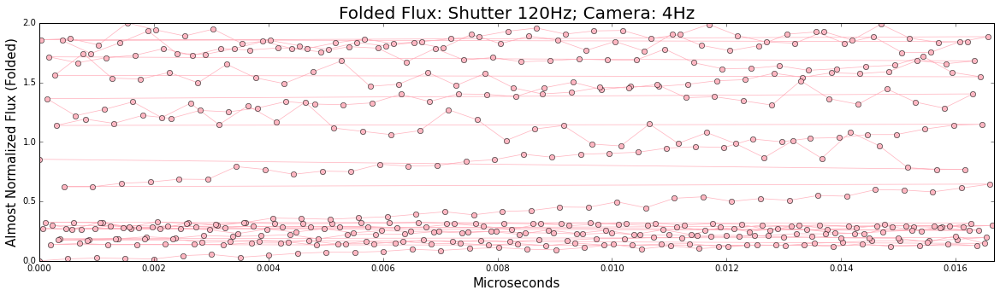

In [17]:
folded_shutter_4 = {}

for key, value in shutter_flux4.iteritems():
    folded_shutter_4[key] = {}
    folded_shutter_4[key]['flux'], folded_shutter_4[key]['time'] = folding(value, runtime4, float(key))
    
    pl.figure(figsize=(20,5))
    pl.plot(folded_shutter_4[key]['time'], folded_shutter_4[key]['flux'], '-', color='lightpink', linewidth=0.75)
    pl.plot(folded_shutter_4[key]['time'], folded_shutter_4[key]['flux'], 'o', color='lightpink')
    pl.xlabel("Microseconds", fontsize=15)
    pl.ylabel("Almost Normalized Flux (Folded)", fontsize=15)
    pl.title('Folded Flux: Shutter '+str(key)+'Hz; Camera: 4Hz', fontsize=20)
    pl.xlim(0,2./key)
    pl.show()

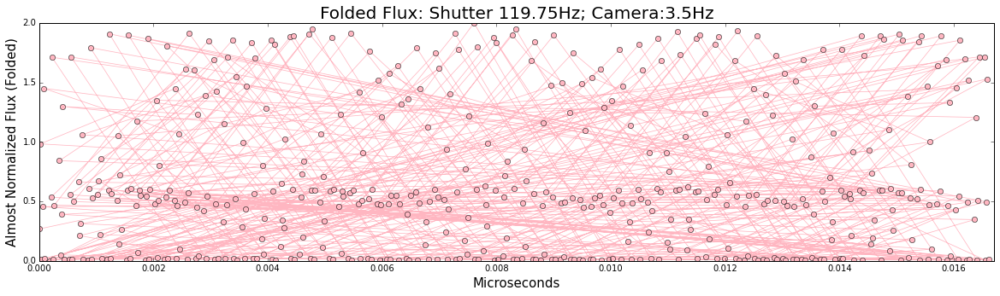

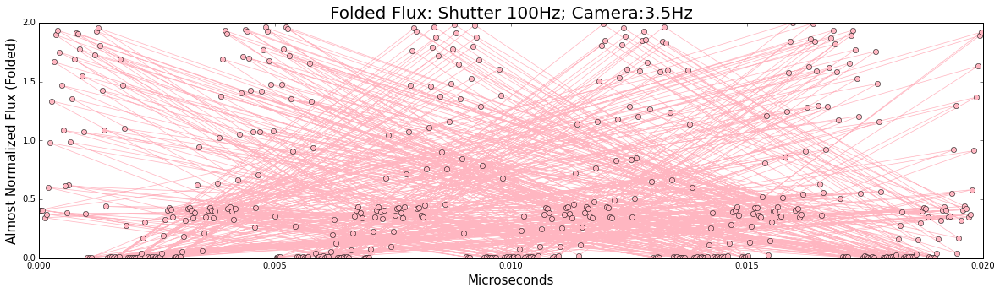

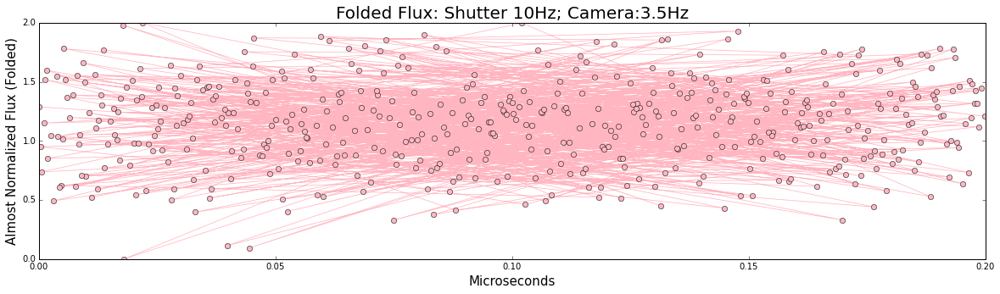

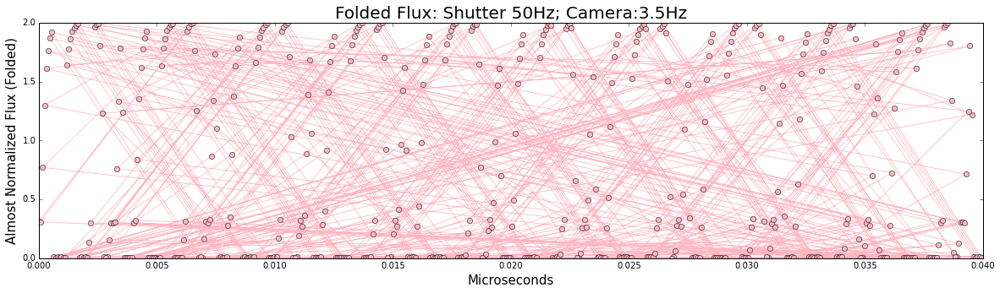

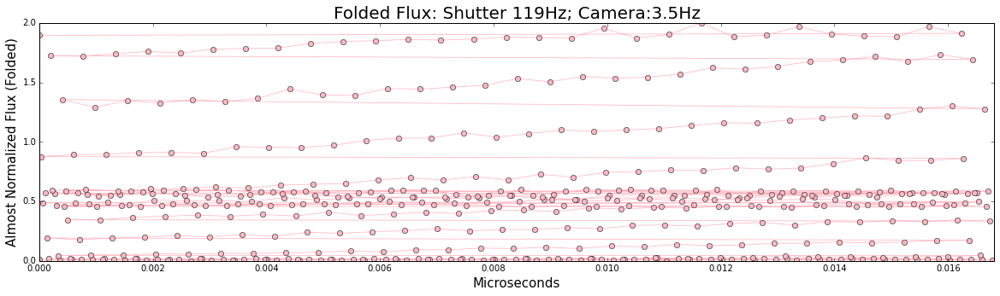

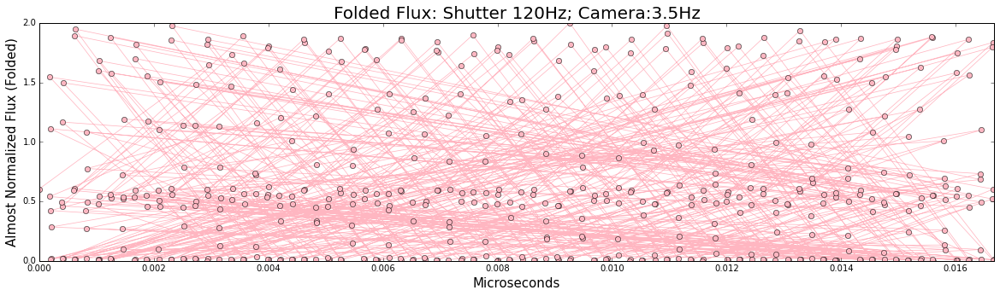

In [18]:
folded_shutter_35 = {}

for key, value in shutter_flux35.iteritems():
    folded_shutter_35[key] = {}
    folded_shutter_35[key]['flux'], folded_shutter_35[key]['time'] = folding(value, runtime35, float(key))
    
    pl.figure(figsize=(20,5))
    pl.plot(folded_shutter_35[key]['time'], folded_shutter_35[key]['flux'], '-', color='lightpink', linewidth=0.75)
    pl.plot(folded_shutter_35[key]['time'], folded_shutter_35[key]['flux'], 'o', color='lightpink')
    pl.xlabel("Microseconds", fontsize=15)
    pl.ylabel("Almost Normalized Flux (Folded)", fontsize=15)
    pl.title('Folded Flux: Shutter '+str(key)+'Hz; Camera:3.5Hz', fontsize=20)
    pl.xlim(0, 2./key)
    pl.show()

#### Without Shutter (folded by pulse frequency)

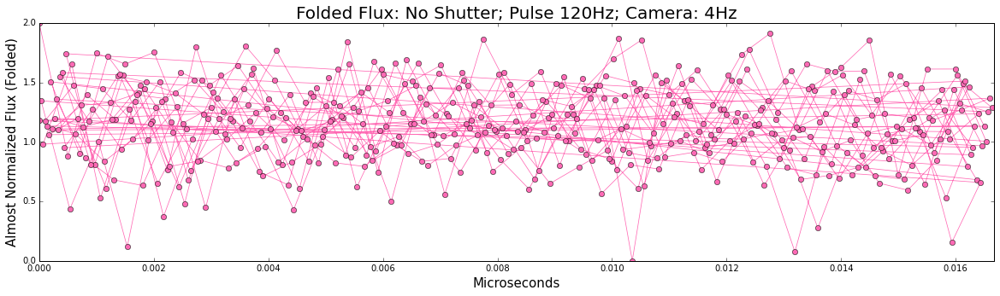

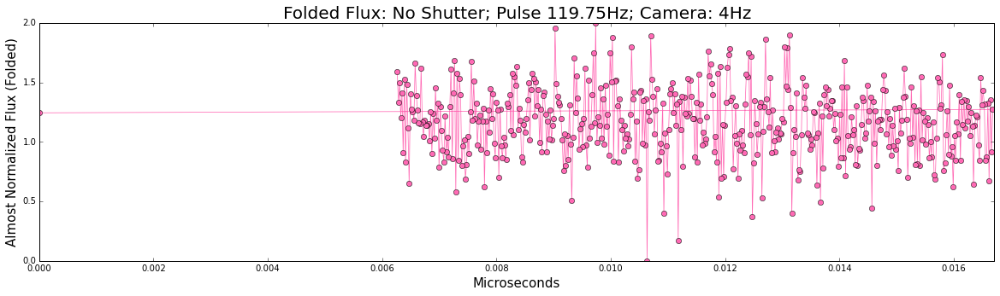

In [19]:
folded_noshutter_4 = {}

for key, value in noshutter_flux4.iteritems():
    if key!=0:
        folded_noshutter_4[key] = {}
        folded_noshutter_4[key]['flux'], folded_noshutter_4[key]['time'] = folding(value, runtime4, float(key))

        pl.figure(figsize=(20,5))
        pl.plot(folded_noshutter_4[key]['time'], folded_noshutter_4[key]['flux'], '-', color='hotpink', linewidth=0.75)
        pl.plot(folded_noshutter_4[key]['time'], folded_noshutter_4[key]['flux'], 'o', color='hotpink')
        pl.xlabel("Microseconds", fontsize=15)
        pl.ylabel("Almost Normalized Flux (Folded)", fontsize=15)
        pl.title('Folded Flux: No Shutter; Pulse '+str(key)+'Hz; Camera: 4Hz', fontsize=20)
        pl.xlim(0,2./key)
        pl.show()

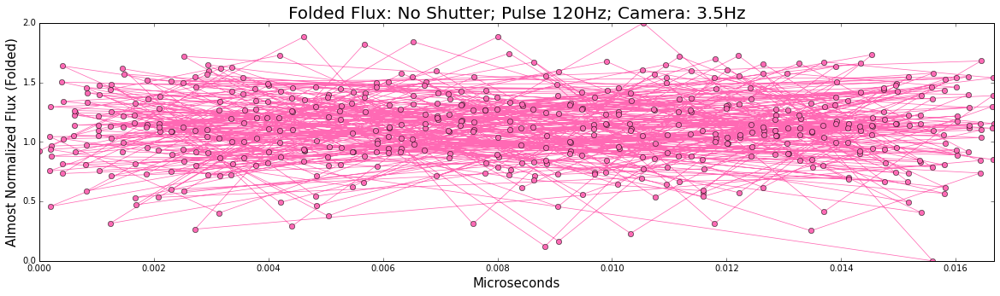

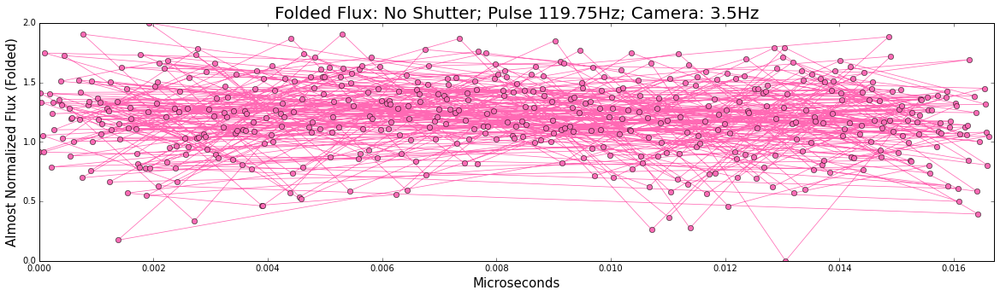

In [20]:
folded_noshutter_35 = {}

for key, value in noshutter_flux35.iteritems():
    if key!=0:
        folded_noshutter_35[key] = {}
        folded_noshutter_35[key]['flux'], folded_noshutter_35[key]['time'] = folding(value, runtime35, float(key))

        pl.figure(figsize=(20,5))
        pl.plot(folded_noshutter_35[key]['time'], folded_noshutter_35[key]['flux'], '-', color='hotpink', linewidth=0.75)
        pl.plot(folded_noshutter_35[key]['time'], folded_noshutter_35[key]['flux'], 'o', color='hotpink')
        pl.xlabel("Microseconds", fontsize=15)
        pl.ylabel("Almost Normalized Flux (Folded)", fontsize=15)
        pl.title('Folded Flux: No Shutter; Pulse '+str(key)+'Hz; Camera: 3.5Hz', fontsize=20)
        pl.xlim(0,2./key)
        pl.show()

## Sine Wave - Simulated Flux & Residuals

In [21]:
# Setup for sine wave
cam4 = np.zeros(150000)
cam4[np.arange(150000)%250 == 0] = 1

cam35 = np.zeros(150000)
cam35[np.arange(150000)%286 == 0] = 1

# Setup for square wave (stack by each ten point)
cam4_05ms = np.zeros(1500000)
cam35_05ms = np.zeros(1500000)

for i in range(10):
    cam4_05ms[i::10] += np.arange(150000)%250 == 0
    cam35_05ms[i::10] += np.arange(150000)%286 == 0

### Flux - Simulated Sine Wave

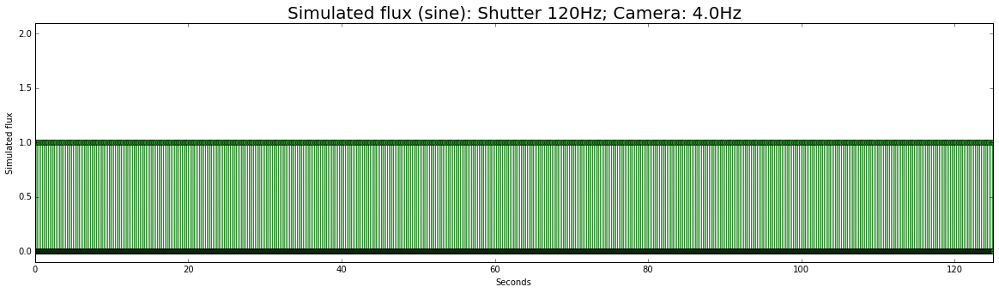

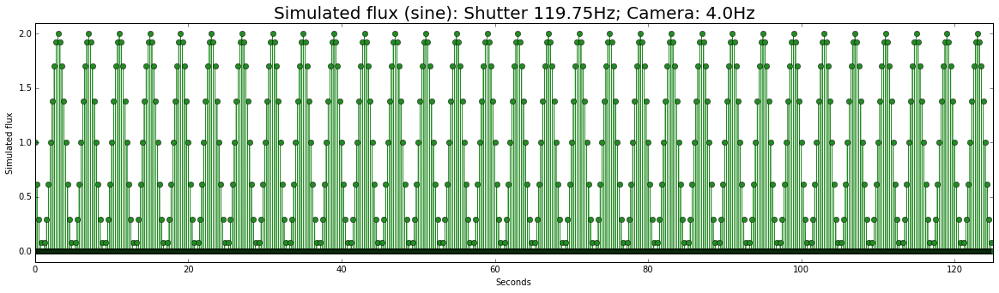

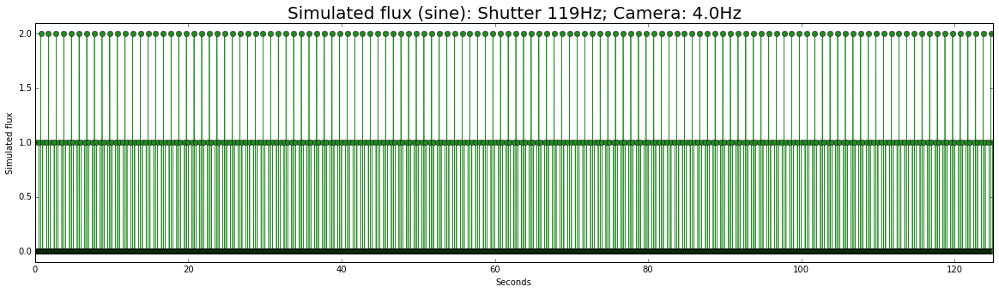

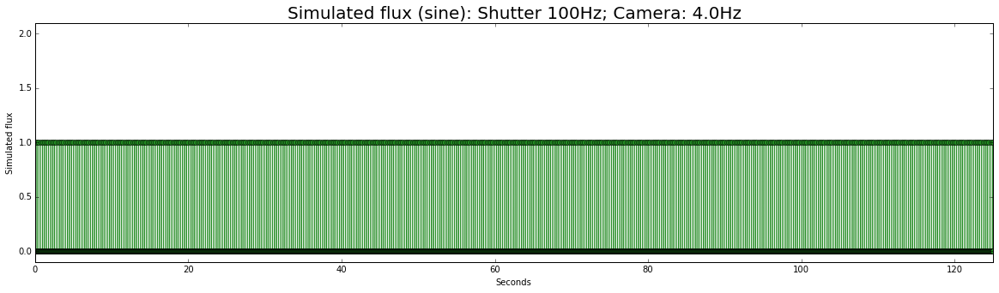

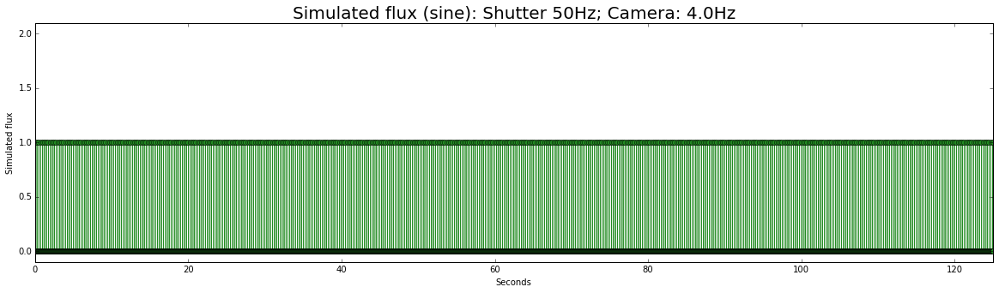

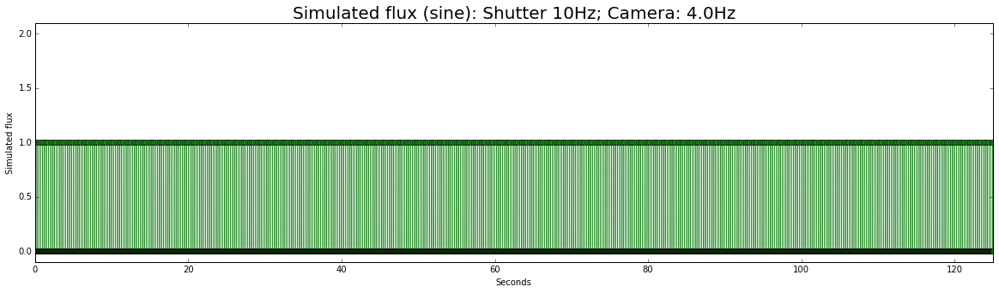

In [22]:
inter_sn4 = camera_meets_shutter_wave('sine', time, cam4, 4.)

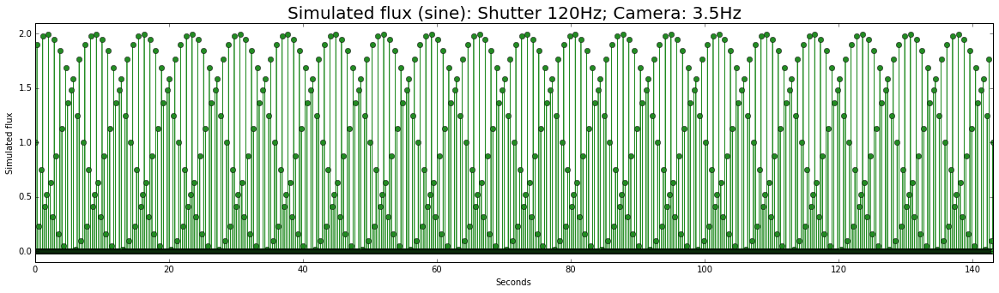

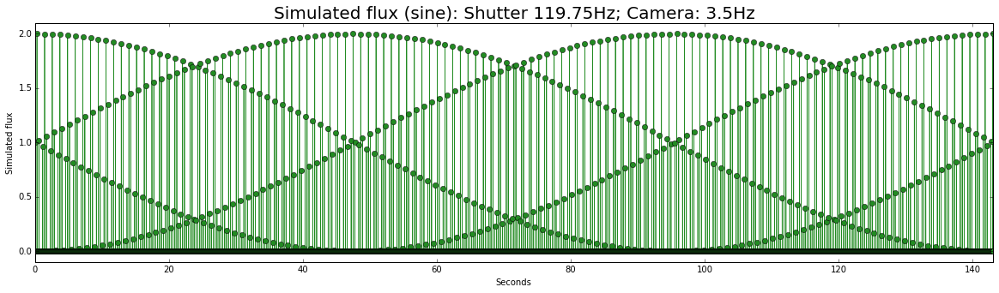

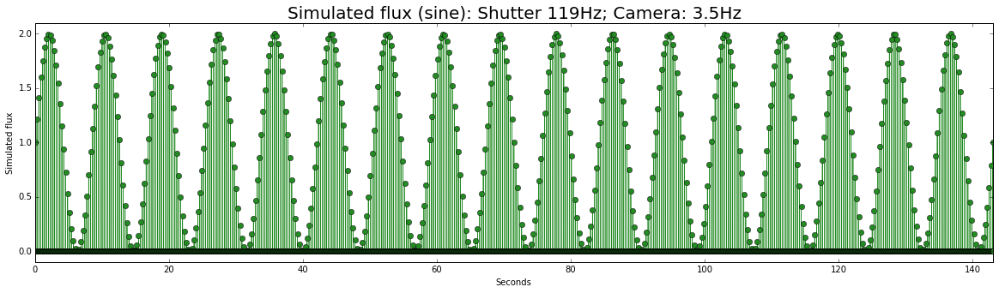

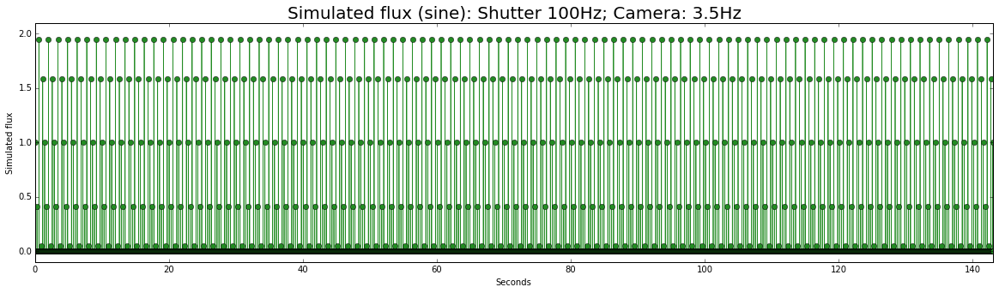

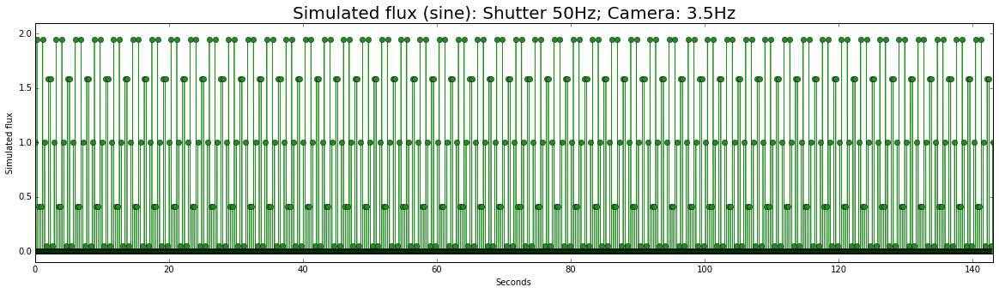

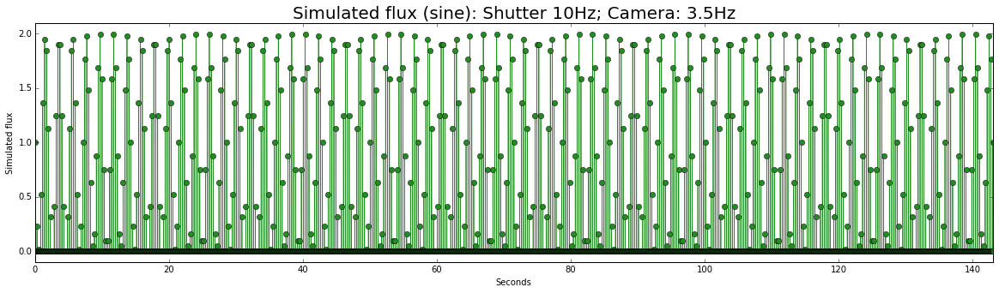

In [23]:
inter_sn35 = camera_meets_shutter_wave('sine', time, cam35, 3.5)

### Residuals (divided by Simulated Sine Wave)

#### With Shutter

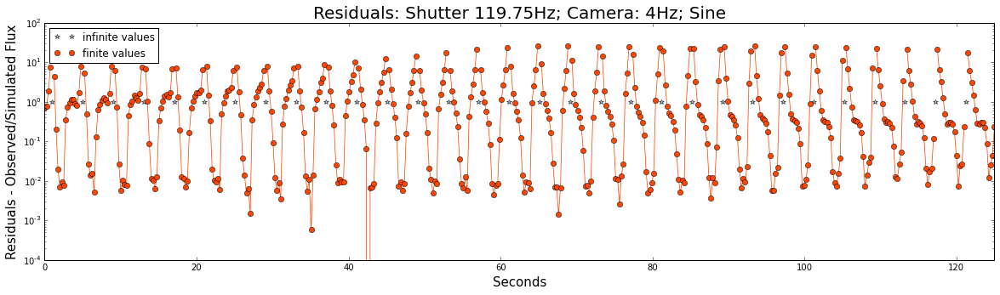

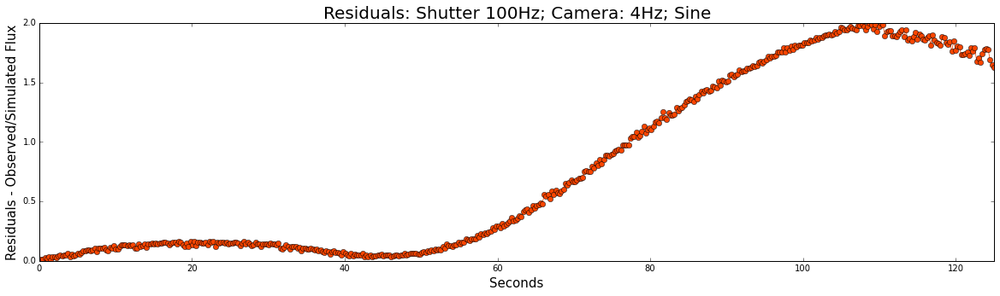

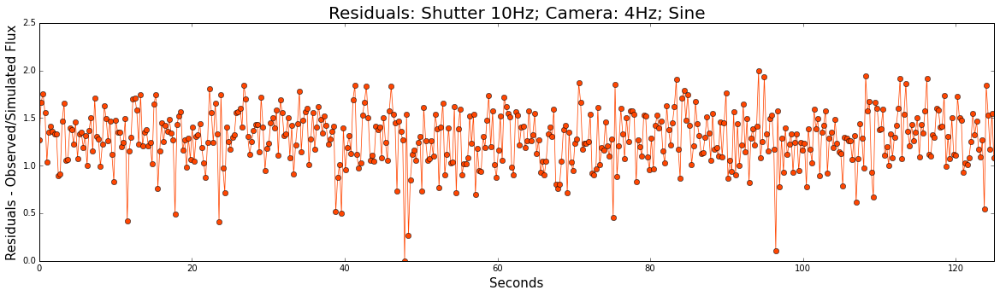

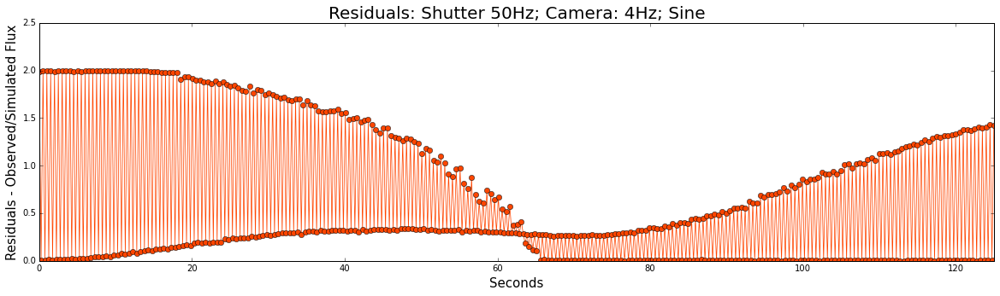

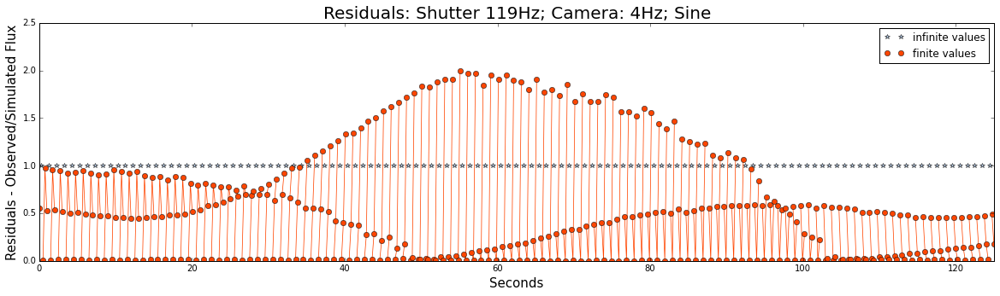

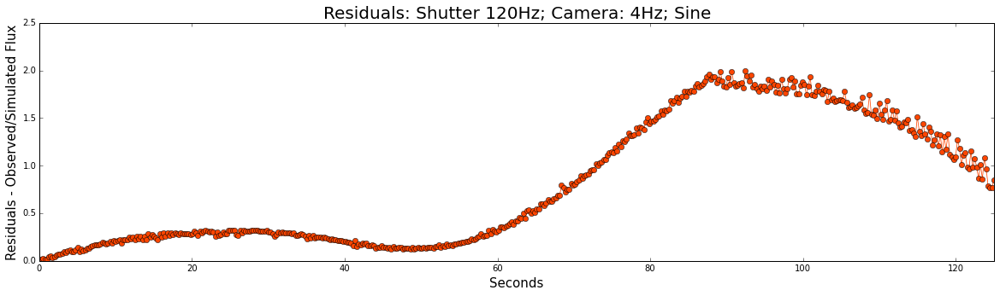

In [24]:
shutter_res_sn4 = {}

for key, value in shutter_flux4.iteritems():
    # to be consistent with the 500 points on the flux wave
    # sample the points on the sine wave over each 250ms interval
    inter_sn4[key] = inter_sn4[key][np.arange(125000)]
    shutter_res_sn4[key] = value/inter_sn4[key][np.arange(125000)%250==0]
    
    pl.figure(figsize=(20,5))
    if key==119.75:
        pl.yscale('log')
    
    inf_idx = np.where(shutter_res_sn4[key]==inf)[0]
    pl.plot(runtime4[inf_idx], np.ones(len(inf_idx)), '*', c='lightsteelblue', label='infinite values')
    
    pl.plot(runtime4, shutter_res_sn4[key], '-', color='orangered', linewidth=0.75)
    pl.plot(runtime4, shutter_res_sn4[key], 'o', color='orangered', label='finite values')
    pl.xlabel("Seconds", fontsize=15)
    pl.ylabel("Residuals - Observed/Simulated Flux", fontsize=15)
    pl.title('Residuals: Shutter '+str(key)+'Hz; Camera: 4Hz; Sine', fontsize=20)
    if inf_idx.size:
        pl.legend(loc='best')
    pl.xlim(0,125)
    pl.show()

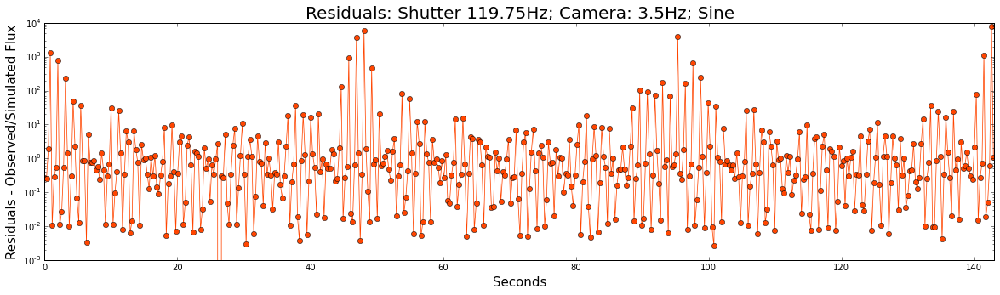

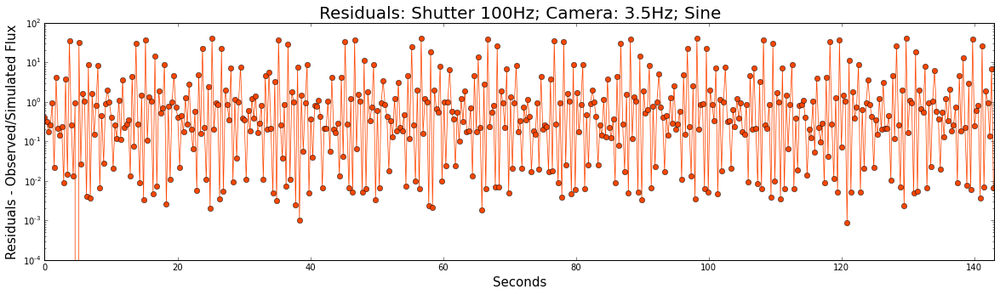

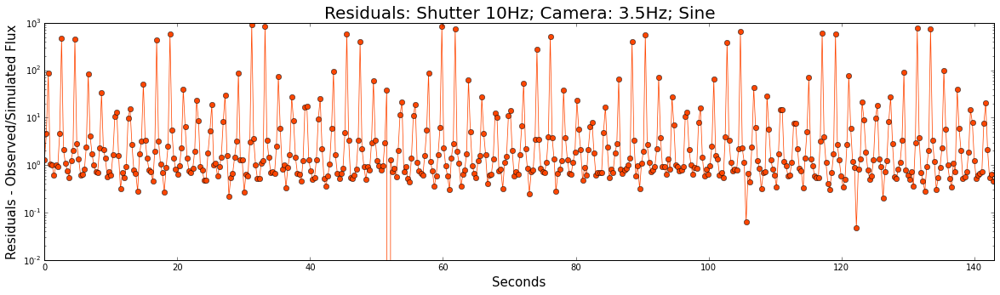

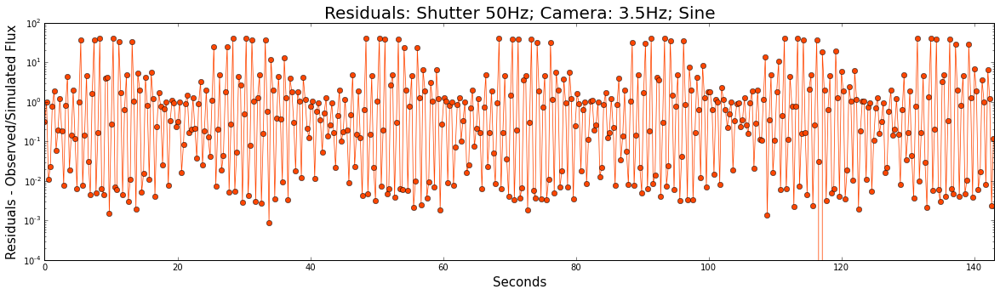

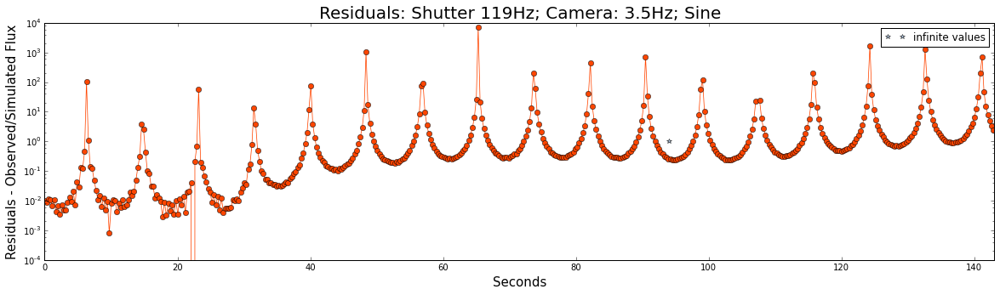

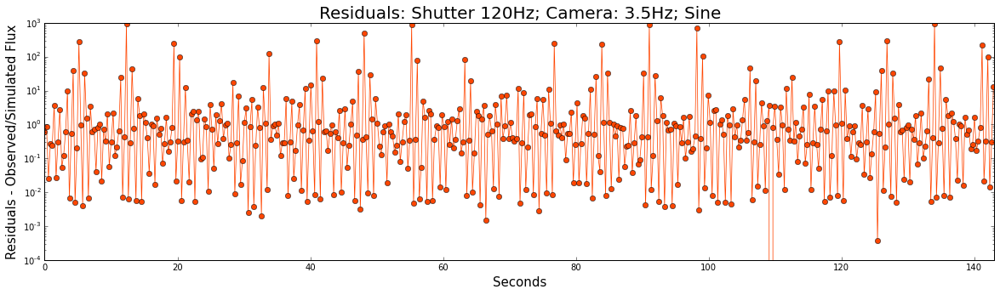

In [25]:
shutter_res_sn35 = {}

for key, value in shutter_flux35.iteritems():
    # to be consistent with the 500 points on the flux wave
    # sample the points on the sine wave over each 286ms interval
    inter_sn35[key] = inter_sn35[key][np.arange(143000)]
    shutter_res_sn35[key] = value/inter_sn35[key][np.arange(143000)%286==0]
    
    pl.figure(figsize=(20,5))
    inf_idx = np.where(shutter_res_sn35[key]==inf)[0]
    pl.plot(runtime4[inf_idx], np.ones(len(inf_idx)), '*', c='lightsteelblue', label='infinite values')
    pl.yscale('log')
    pl.plot(runtime35, shutter_res_sn35[key], '-', color='orangered', linewidth=0.75)
    pl.plot(runtime35, shutter_res_sn35[key], 'o', color='orangered')
    pl.xlabel("Seconds", fontsize=15)
    pl.ylabel("Residuals - Observed/Simulated Flux", fontsize=15)
    pl.title('Residuals: Shutter '+str(key)+'Hz; Camera: 3.5Hz; Sine', fontsize=20)
    if inf_idx.size:
        pl.legend(loc='best')
    xlim(0,143)
    pl.show()

#### Without Shutter

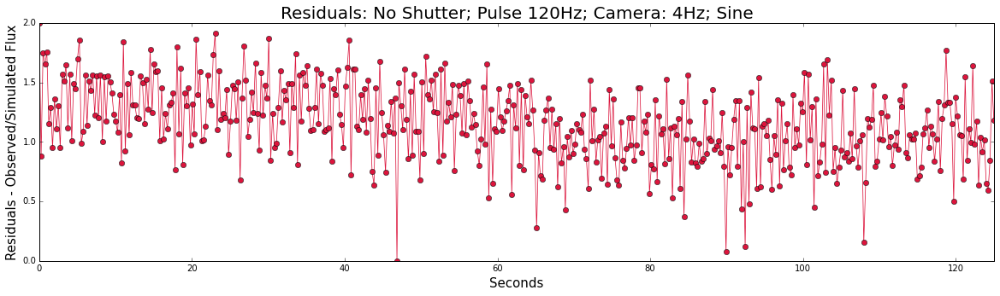

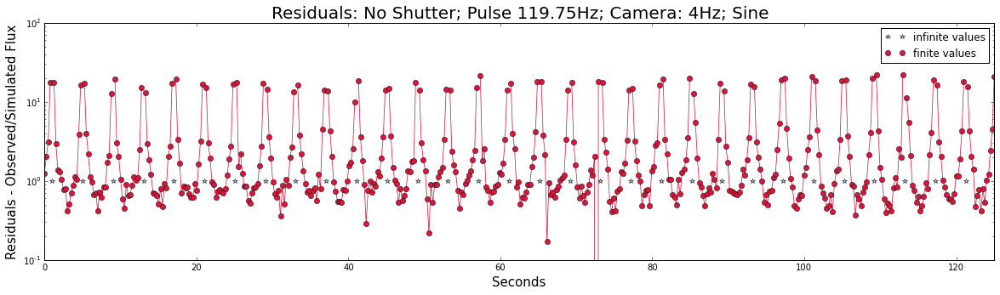

In [26]:
noshutter_res_sn4 = {}

for key, value in noshutter_flux4.iteritems():
    # to be consistent with the 500 points on the flux wave
    # sample the points on the sine wave over each 250ms interval
    if key!=0:
        inter_sn4[key] = inter_sn4[key][np.arange(125000)]
        noshutter_res_sn4[key] = value/inter_sn4[key][np.arange(125000)%250==0]

        pl.figure(figsize=(20,5))
        if key==119.75:
            pl.yscale('log')

        inf_idx = np.where(noshutter_res_sn4[key]==inf)[0]
        pl.plot(runtime4[inf_idx], np.ones(len(inf_idx)), '*', c='lightsteelblue', label='infinite values')

        pl.plot(runtime4, noshutter_res_sn4[key], '-', color='crimson', linewidth=0.75)
        pl.plot(runtime4, noshutter_res_sn4[key], 'o', color='crimson', label='finite values')
        pl.xlabel("Seconds", fontsize=15)
        pl.ylabel("Residuals - Observed/Simulated Flux", fontsize=15)
        pl.title('Residuals: No Shutter; Pulse '+str(key)+'Hz; Camera: 4Hz; Sine', fontsize=20)
        if inf_idx.size:
            pl.legend(loc='best')
        pl.xlim(0,125)
        pl.show()

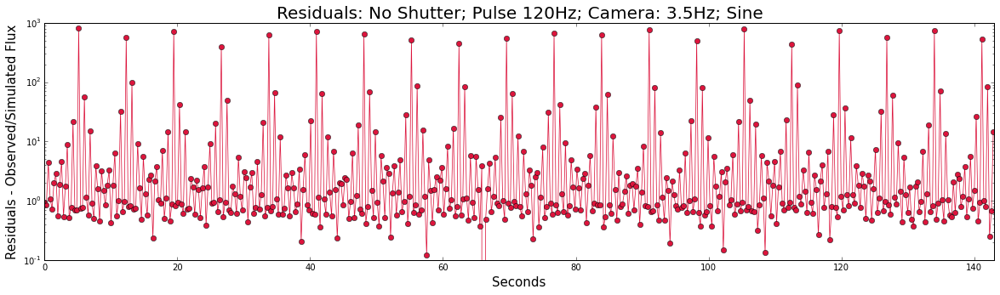

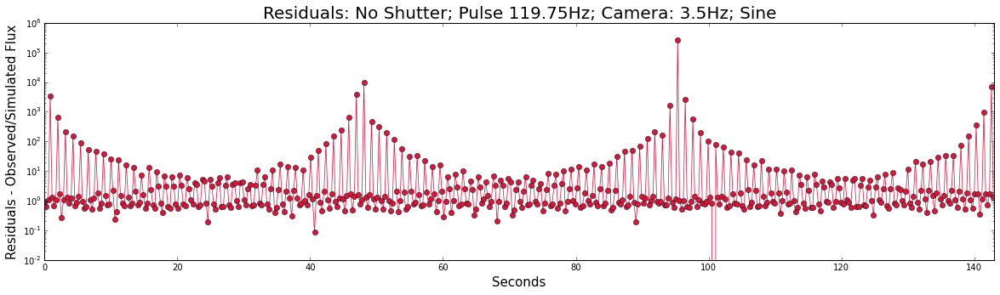

In [27]:
noshutter_res_sn35 = {}

for key, value in noshutter_flux35.iteritems():
    # to be consistent with the 500 points on the flux wave
    # sample the points on the sine wave over each 250ms interval
    if key!=0:
        inter_sn35[key] = inter_sn35[key][np.arange(143000)]
        noshutter_res_sn35[key] = value/inter_sn35[key][np.arange(143000)%286==0]

        pl.figure(figsize=(20,5))
        pl.yscale('log')

        inf_idx = np.where(noshutter_res_sn35[key]==inf)[0]
        pl.plot(runtime35[inf_idx], np.ones(len(inf_idx)), '*', c='lightsteelblue', label='infinite values')

        pl.plot(runtime35, noshutter_res_sn35[key], '-', color='crimson', linewidth=0.75)
        pl.plot(runtime35, noshutter_res_sn35[key], 'o', color='crimson', label='finite values')
        pl.xlabel("Seconds", fontsize=15)
        pl.ylabel("Residuals - Observed/Simulated Flux", fontsize=15)
        pl.title('Residuals: No Shutter; Pulse '+str(key)+'Hz; Camera: 3.5Hz; Sine', fontsize=20)
        if inf_idx.size:
            pl.legend(loc='best')
        pl.xlim(0,143)
        pl.show()

## Square Wave - Simulated Flux & Residuals

(1500000,)


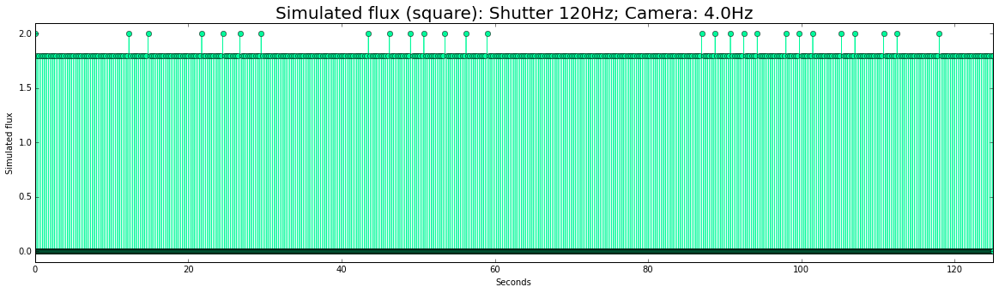

ValueError: operands could not be broadcast together with shapes (150000,) (1500000,) 

In [28]:
inter_sq4 = camera_meets_shutter_wave('square', time2, cam4_05ms, 4.)

In [ ]:
inter_sq4 = camera_meets_shutter_wave('square', time2, cam4_05ms, 4.)

## Power Spectrum (no shutter)

(250, 126)
(250, 126)
(250, 126)


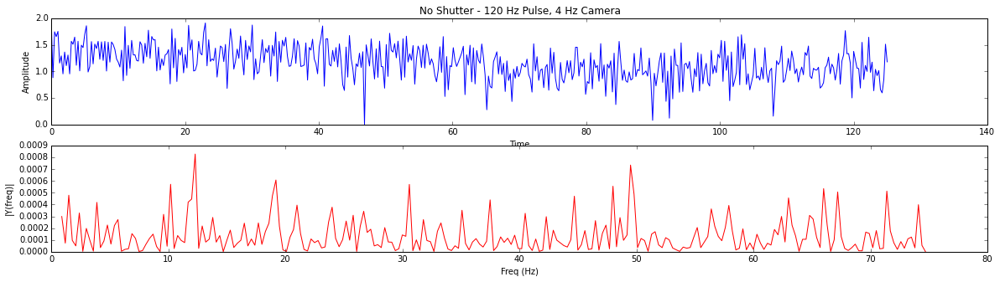

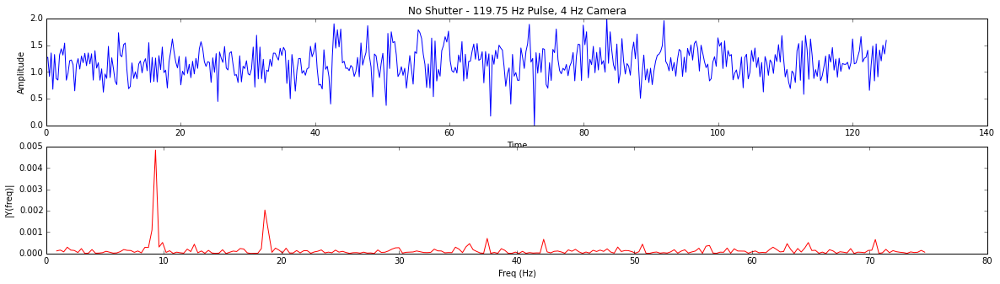

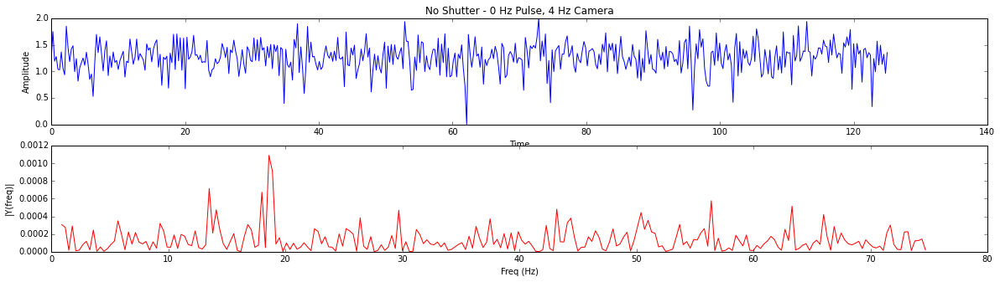

In [30]:
Fs = 150.0;  # sampling rate
#Ts = 1.0/Fs; # sampling interval
for i in noshutter_flux4:
    t = runtime4 # time vector

    y = noshutter_flux4[i]

    n = len(y) # length of the signal
    k = np.arange(n)
    T = n/Fs
    frq = k/T # two sides frequency range
    frq = frq[range(n/2)] # one side frequency range

    Y = np.fft.rfft(y)/n # fft computing and normalization
    Y = (Y*Y)[:n/2]
    print (len(Y) , len (np.fft.rfftfreq(len(frq), t[1]-t[0])))

    fig, ax = pl.subplots(2, 1)
    ax[0].plot(t,y)
    ax[0].set_title('No Shutter - '+str(i)+' Hz Pulse, 4 Hz Camera')
    ax[0].set_xlabel('Time')
    ax[0].set_ylabel('Amplitude')
    ax[1].plot(frq[3:],abs(Y[3:]),'r') # plotting the spectrum
    ax[1].set_xlabel('Freq (Hz)')
    ax[1].set_ylabel('|Y(freq)|')

pl.show()

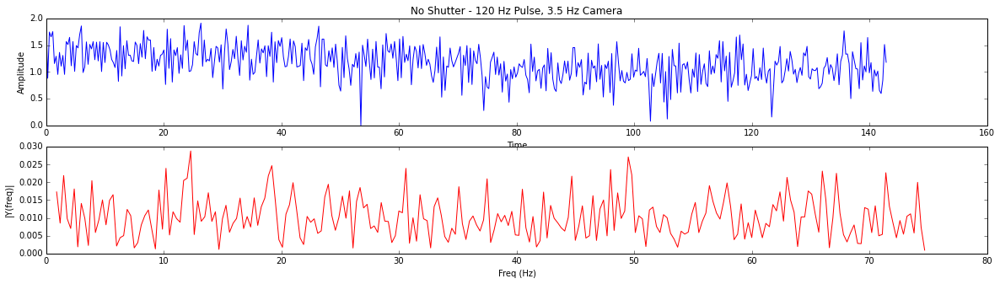

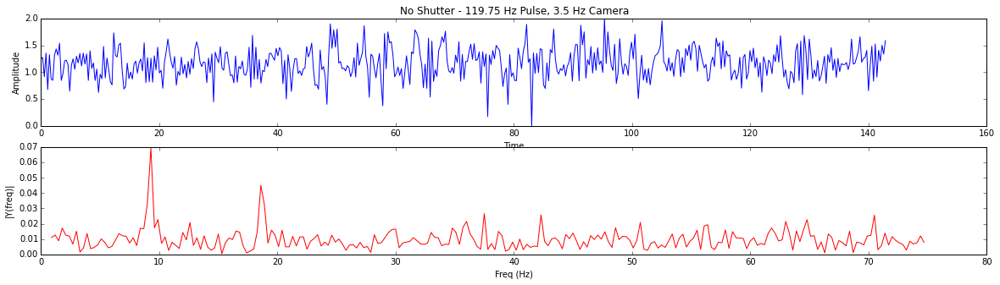

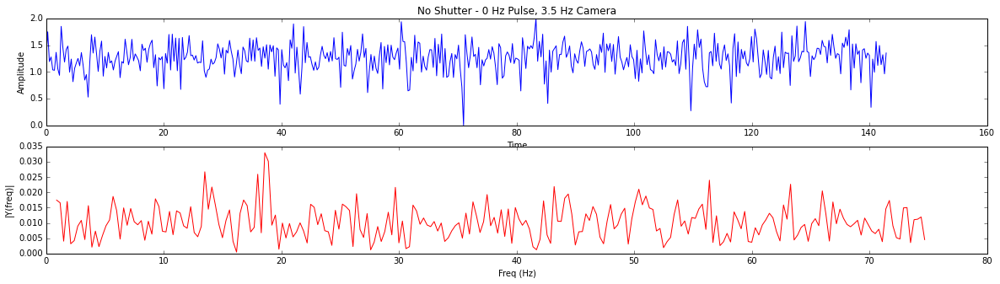

In [31]:
for i in noshutter_flux35:
    t = runtime35 # time vector

    y = noshutter_flux4[i]

    n = len(y) # length of the signal
    k = np.arange(n)
    T = n/Fs
    frq = k/T # two sides frequency range
    frq = frq[range(n/2)] # one side frequency range

    Y = np.fft.fft(y)/n # fft computing and normalization
    Y = Y[range(n/2)]

    fig, ax = pl.subplots(2, 1)
    ax[0].plot(t,y)
    ax[0].set_title('No Shutter - '+str(i)+' Hz Pulse, 3.5 Hz Camera')
    ax[0].set_xlabel('Time')
    ax[0].set_ylabel('Amplitude')
    ax[1].plot(frq[3:],abs(Y[3:]),'r') # plotting the spectrum
    ax[1].set_xlabel('Freq (Hz)')
    ax[1].set_ylabel('|Y(freq)|')

pl.show()